In [43]:
%pip install --upgrade openai
%pip install --upgrade tqdm

%pip install python-igraph leidenalg

Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.2.1 -> 24.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [44]:
from openai import OpenAI
from tqdm import tqdm

from src.helper_func.file_util import *
from src.helper_func.graph_util import *

from collections import Counter
import time

import networkx as nx
import matplotlib.pyplot as plt
from cdlib import algorithms, viz

In [3]:
config = read_ini_file('../config.ini')
project_name = config['project']['name']
project_desc = config['project']['desc']
(project_name,project_desc)

('bitcoin-wallet-v6.31',
 'Bitcoin Wallet, a standalone Bitcoin payment app for your Android device!')

In [5]:
ifile_lyr = f'../../test/2-architecture-layering-output/{project_name}-with-layers-20240613-002903.json'
graph_lyr = read_json_file(ifile_lyr)
nodes_lyr,edges_lyr = transform_graph(graph_lyr)

len(nodes_lyr), nodes_lyr

(3999,
 {'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater': {'id': 'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater',
   'properties': {'simpleName': 'inflater',
    'qualifiedName': 'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater',
    'kind': 'parameter',
    'metaSrc': 'source code'},
   'labels': ['Variable']},
  'de.schildbach.wallet.ui.TransactionsAdapter.de.schildbach.wallet.ui.TransactionsAdapter(android.content.Context,int,de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener).context': {'id': 'de.schildbach.wallet.ui.TransactionsAdapter.de.schildbach.wallet.ui.TransactionsAdapter(android.content.Context,int,de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener).context',
   'properties': {'simpleName': 'context',
    'qualifiedName': 'de.schildbach.wa

In [6]:
# Get all unique values of 'labels'
unique_labels = set(label for node in nodes_lyr.values() for label in node['labels'])

# Print the unique labels
print(unique_labels)

{'Structure', 'Variable', 'Container', 'Primitive', 'Script', 'Operation', 'Constructor'}


In [7]:
# Flatten the list of labels and count each label
label_counts = Counter(label for node in nodes_lyr.values() for label in node['labels'])

total_nodes = 0

# Print the count of each label
for label, count in label_counts.items():
    total_nodes += count
    print(f"{label}: {count}")
	
print(f"All labels: {total_nodes}")

Variable: 2459
Operation: 1042
Constructor: 236
Structure: 236
Container: 16
Primitive: 8
Script: 2
All labels: 3999


In [8]:
presentation_layer_nodes = [node_id for node_id, node_data in nodes_lyr.items() if node_data['properties'].get('layer') == 'Presentation Layer']

len(presentation_layer_nodes), presentation_layer_nodes

(423,
 ['de.schildbach.wallet.ui.WalletDisclaimerFragment.onCreate(android.os.Bundle)',
  'de.schildbach.wallet.ui.CurrencyAmountView.setContextButton(int,de.schildbach.wallet.ui.OnClickListener)',
  'de.schildbach.wallet.ui.WalletActivity.de.schildbach.wallet.ui.WalletActivity()',
  'de.schildbach.wallet.util.CheatSheet.remove(android.view.View)',
  'de.schildbach.wallet.ui.monitor.NetworkMonitorActivity$PagerAdapter.de.schildbach.wallet.ui.monitor.NetworkMonitorActivity$PagerAdapter(android.support.v4.app.FragmentManager)',
  'de.schildbach.wallet.ui.CurrencySymbolDrawable.draw(android.graphics.Canvas)',
  'de.schildbach.wallet.ui.ExchangeRatesAdapter.de.schildbach.wallet.ui.ExchangeRatesAdapter(android.content.Context,de.schildbach.wallet.ui.ExchangeRatesAdapter$OnClickListener)',
  'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment.onCreateDialog(android.os.Bundle)',
  'de.schildbach.wallet.util.Toast.postToast(java.lang.CharSequence)',
  'de

In [9]:
len(edges_lyr), edges_lyr

(10,
 {'hasParameter': [{'id': '72fe929b625bb29f983f38a0f208ece6',
    'source': 'de.schildbach.wallet.ui.WalletTransactionsFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater)',
    'label': 'hasParameter',
    'properties': {'weight': 1, 'metaSrc': 'source code'},
    'target': 'de.schildbach.wallet.ui.WalletTransactionsFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).menu'},
   {'id': '11ac321a8a9254f6039f2b93105a0692',
    'source': 'de.schildbach.wallet.service.BlockchainService$NewTransactionLiveData$WalletListener.onCoinsSent(org.bitcoinj.wallet.Wallet,org.bitcoinj.core.Transaction,org.bitcoinj.core.Coin,org.bitcoinj.core.Coin)',
    'label': 'hasParameter',
    'properties': {'weight': 1, 'metaSrc': 'source code'},
    'target': 'de.schildbach.wallet.service.BlockchainService$NewTransactionLiveData$WalletListener.onCoinsSent(org.bitcoinj.wallet.Wallet,org.bitcoinj.core.Transaction,org.bitcoinj.core.Coin,org.bitcoinj.core.Coin).tx'},

In [10]:
edges_lyr.keys()

dict_keys(['hasParameter', 'invokes', 'hasScript', 'contains', 'type', 'returnType', 'hasVariable', 'instantiates', 'specializes', 'nests'])

In [11]:
total_edges = 0

# Count and print the count of each label
for key in edges_lyr.keys():
	total_edges += len(edges_lyr[key])
	print(f"{key}: {len(edges_lyr[key])}")
	
print(f"All labels: {total_edges}")

hasParameter: 1334
invokes: 1237
hasScript: 1280
contains: 250
type: 1171
returnType: 483
hasVariable: 1125
instantiates: 210
specializes: 40
nests: 97
All labels: 7227


In [12]:
p_edges_list = []
# for key in edges.keys(): 
p_edges_list += edges_lyr['contains'] + edges_lyr['hasScript'] + edges_lyr['invokes'] # edges[key]

len(p_edges_list), p_edges_list

(2767,
 [{'id': '14035a62aefc17bbf3ebde4c89c2a108',
   'source': 'de.schildbach.wallet',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui'},
  {'id': '94d1142fdafeeea252421e5f3d60a081',
   'source': 'de.schildbach.wallet.ui',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.EncryptKeysDialogFragment'},
  {'id': 'aa704992d555c05cbda28431e2a38aac',
   'source': 'de.schildbach.wallet.ui.scan',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.scan.ScanActivity'},
  {'id': '5f1735bfcd0193eae440213fca4b55a7',
   'source': 'de.schildbach.wallet.ui.monitor',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.monitor.PeerListFragment$HostnamesLiveData'},
  {'id': '51ffda58e93b22d16ee775f682876018',
   'source': 'de.sc

In [14]:
presentation_layer_edges_1 = extract_edges(p_edges_list, presentation_layer_nodes)

len(presentation_layer_edges_1), presentation_layer_edges_1

(122,
 [{'id': 'b81cca3fef4c66f9d0d74f07ecce88eb',
   'source': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.requestFocus()',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.activeTextView()'},
  {'id': 'd5dd08b9e6e3db27a16f5f2599047ccb',
   'source': 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment.onRequestPermissionsResult(int,java.lang.String[],int[])',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment.showDialog(android.support.v4.app.FragmentManager)'},
  {'id': '299c3b9a9e6994003e0795a21d5fadba',
   'source': 'de.schildbach.wallet.ui.send.SendCoinsFragment.onPause()',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.setListener(de.schildbach.wallet.

In [15]:
p_layer_edges_invokes = [edge for edge in presentation_layer_edges_1 if edge['label']=='invokes']

len(p_layer_edges_invokes), p_layer_edges_invokes

(122,
 [{'id': 'b81cca3fef4c66f9d0d74f07ecce88eb',
   'source': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.requestFocus()',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.activeTextView()'},
  {'id': 'd5dd08b9e6e3db27a16f5f2599047ccb',
   'source': 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment.onRequestPermissionsResult(int,java.lang.String[],int[])',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment.showDialog(android.support.v4.app.FragmentManager)'},
  {'id': '299c3b9a9e6994003e0795a21d5fadba',
   'source': 'de.schildbach.wallet.ui.send.SendCoinsFragment.onPause()',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.setListener(de.schildbach.wallet.

In [16]:
lifting_edges = lift(edges_lyr['hasScript'], p_layer_edges_invokes)

len(lifting_edges), lifting_edges

(67,
 [{'source': 'de.schildbach.wallet.ui.SendingAddressesFragment',
   'target': 'de.schildbach.wallet.ui.scan.ScanActivity',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 1}},
  {'source': 'de.schildbach.wallet.util.Toast',
   'target': 'de.schildbach.wallet.util.Toast',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 4}},
  {'source': 'de.schildbach.wallet.ui.RequestCoinsFragment',
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 2}},
  {'source': 'de.schildbach.wallet.ui.send.SendCoinsFragment',
   'target': 'de.schildbach.wallet.ui.scan.ScanActivity',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 1}},
  {'source': 'de.schildbach.wallet.ui.HelpDialogFragment',
   'target': 'de.schildbach.wallet.ui.DialogBuilder',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 1}},
  {'source': 'de.s

In [17]:
lifting_edges = [edge for edge in lifting_edges if edge['source']!=edge['target']]

len(lifting_edges), lifting_edges

(55,
 [{'source': 'de.schildbach.wallet.ui.SendingAddressesFragment',
   'target': 'de.schildbach.wallet.ui.scan.ScanActivity',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 1}},
  {'source': 'de.schildbach.wallet.ui.RequestCoinsFragment',
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 2}},
  {'source': 'de.schildbach.wallet.ui.send.SendCoinsFragment',
   'target': 'de.schildbach.wallet.ui.scan.ScanActivity',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 1}},
  {'source': 'de.schildbach.wallet.ui.HelpDialogFragment',
   'target': 'de.schildbach.wallet.ui.DialogBuilder',
   'label': 'hasScript-invokes-inv_hasScript',
   'properties': {'weight': 1}},
  {'source': 'de.schildbach.wallet.ui.scan.ScanActivity',
   'target': 'de.schildbach.wallet.ui.scan.ScanActivity$WarnDialogFragment',
   'label': 'hasScript-invokes-inv_hasScript',
   'properti

In [34]:
# Create a new graph
G = nx.Graph()

# Add nodes to the graph
# G.add_nodes_from(presentation_layer_nodes)

# Add edges to the graph
for edge in lifting_edges:
    # if {'Operation','Constructor','Script'} & set(nodes_lyr[edge['source']]['labels']) and {'Operation','Constructor','Script'} & set(nodes_lyr[edge['target']]['labels']):
        G.add_edge(edge['source'], edge['target'])

# Find connected components
connected_components_1 = list(nx.connected_components(G))

# Now, connected_components is a list of sets, where each set is a connected component (i.e., a sublist of nodes that are connected to each other)

In [35]:
len(connected_components_1)

5

In [36]:
connected_components_1

[{'de.schildbach.wallet.ui.AbstractWalletActivity',
  'de.schildbach.wallet.ui.CurrencyAmountView',
  'de.schildbach.wallet.ui.CurrencyAmountView$Listener',
  'de.schildbach.wallet.ui.CurrencyAmountView$TextViewListener',
  'de.schildbach.wallet.ui.CurrencyCalculatorLink',
  'de.schildbach.wallet.ui.DialogBuilder',
  'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
  'de.schildbach.wallet.ui.EncryptKeysDialogFragment',
  'de.schildbach.wallet.ui.FancyListFragment',
  'de.schildbach.wallet.ui.HelpDialogFragment',
  'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
  'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
  'de.schildbach.wallet.ui.RequestCoinsActivity',
  'de.schildbach.wallet.ui.RequestCoinsFragment',
  'de.schildbach.wallet.ui.SendingAddressesFragment',
  'de.schildbach.wallet.ui.WalletActionsFragment',
  'de.schildbach.wallet.ui.WalletActivity',
  'de.schildbach.wallet.ui.WalletAddressDialogFragment',
  'de.schildbach.wallet.ui.WalletAddressesAdapter',
  'de.sch

In [37]:
len(connected_components_1[0]), connected_components_1[0]

(44,
 {'de.schildbach.wallet.ui.AbstractWalletActivity',
  'de.schildbach.wallet.ui.CurrencyAmountView',
  'de.schildbach.wallet.ui.CurrencyAmountView$Listener',
  'de.schildbach.wallet.ui.CurrencyAmountView$TextViewListener',
  'de.schildbach.wallet.ui.CurrencyCalculatorLink',
  'de.schildbach.wallet.ui.DialogBuilder',
  'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
  'de.schildbach.wallet.ui.EncryptKeysDialogFragment',
  'de.schildbach.wallet.ui.FancyListFragment',
  'de.schildbach.wallet.ui.HelpDialogFragment',
  'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
  'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
  'de.schildbach.wallet.ui.RequestCoinsActivity',
  'de.schildbach.wallet.ui.RequestCoinsFragment',
  'de.schildbach.wallet.ui.SendingAddressesFragment',
  'de.schildbach.wallet.ui.WalletActionsFragment',
  'de.schildbach.wallet.ui.WalletActivity',
  'de.schildbach.wallet.ui.WalletAddressDialogFragment',
  'de.schildbach.wallet.ui.WalletAddressesAdapter',
  'd

In [38]:
# Sort components by greater size
sorted_components_1 = sorted(connected_components_1, key=len, reverse=True)

for i, component in enumerate(sorted_components_1):
	print(f"Feature {i+1}: {len(component)}")
	
sorted_components_1[0]

Feature 1: 44
Feature 2: 3
Feature 3: 2
Feature 4: 2
Feature 5: 2


{'de.schildbach.wallet.ui.AbstractWalletActivity',
 'de.schildbach.wallet.ui.CurrencyAmountView',
 'de.schildbach.wallet.ui.CurrencyAmountView$Listener',
 'de.schildbach.wallet.ui.CurrencyAmountView$TextViewListener',
 'de.schildbach.wallet.ui.CurrencyCalculatorLink',
 'de.schildbach.wallet.ui.DialogBuilder',
 'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
 'de.schildbach.wallet.ui.EncryptKeysDialogFragment',
 'de.schildbach.wallet.ui.FancyListFragment',
 'de.schildbach.wallet.ui.HelpDialogFragment',
 'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
 'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
 'de.schildbach.wallet.ui.RequestCoinsActivity',
 'de.schildbach.wallet.ui.RequestCoinsFragment',
 'de.schildbach.wallet.ui.SendingAddressesFragment',
 'de.schildbach.wallet.ui.WalletActionsFragment',
 'de.schildbach.wallet.ui.WalletActivity',
 'de.schildbach.wallet.ui.WalletAddressDialogFragment',
 'de.schildbach.wallet.ui.WalletAddressesAdapter',
 'de.schildbach.wallet.ui.Wa

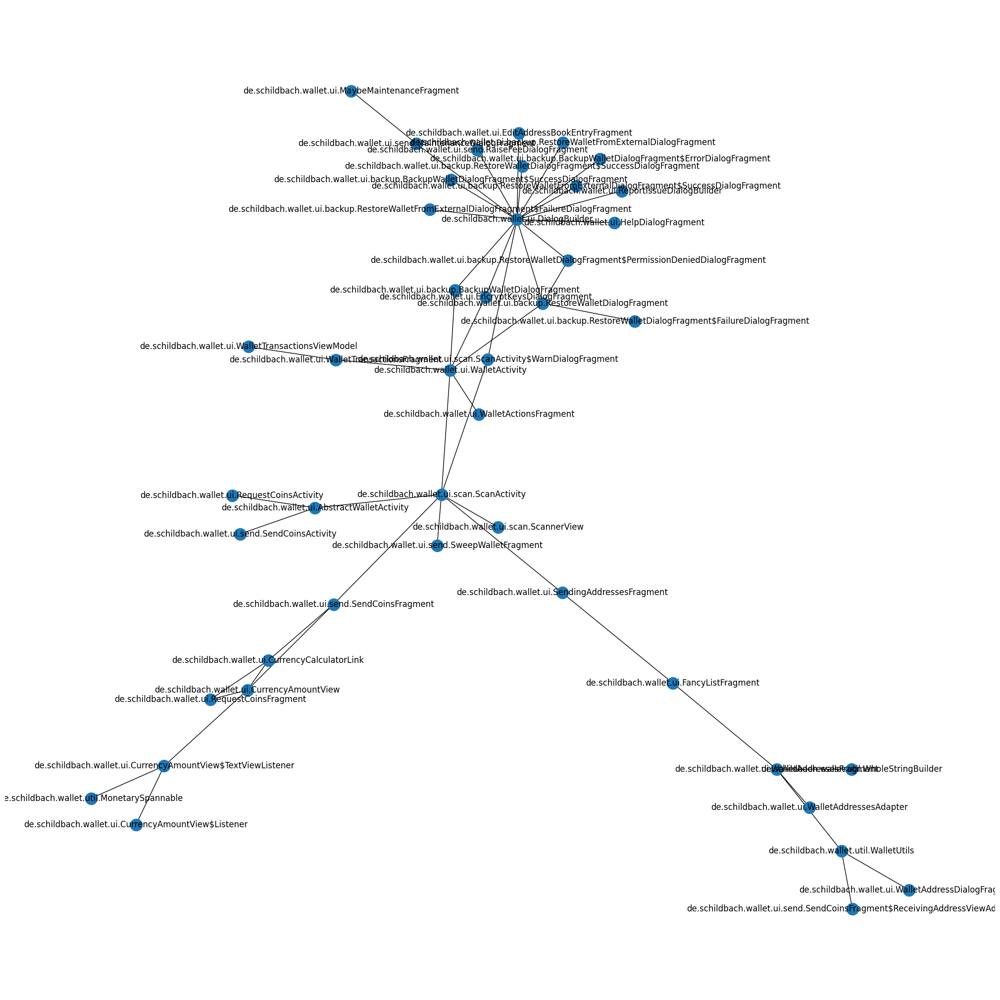

In [39]:
subgraph_1 = G.subgraph(sorted_components_1[0])
plt.figure(figsize=(20, 20))
nx.draw(subgraph_1, with_labels=True)
plt.show()

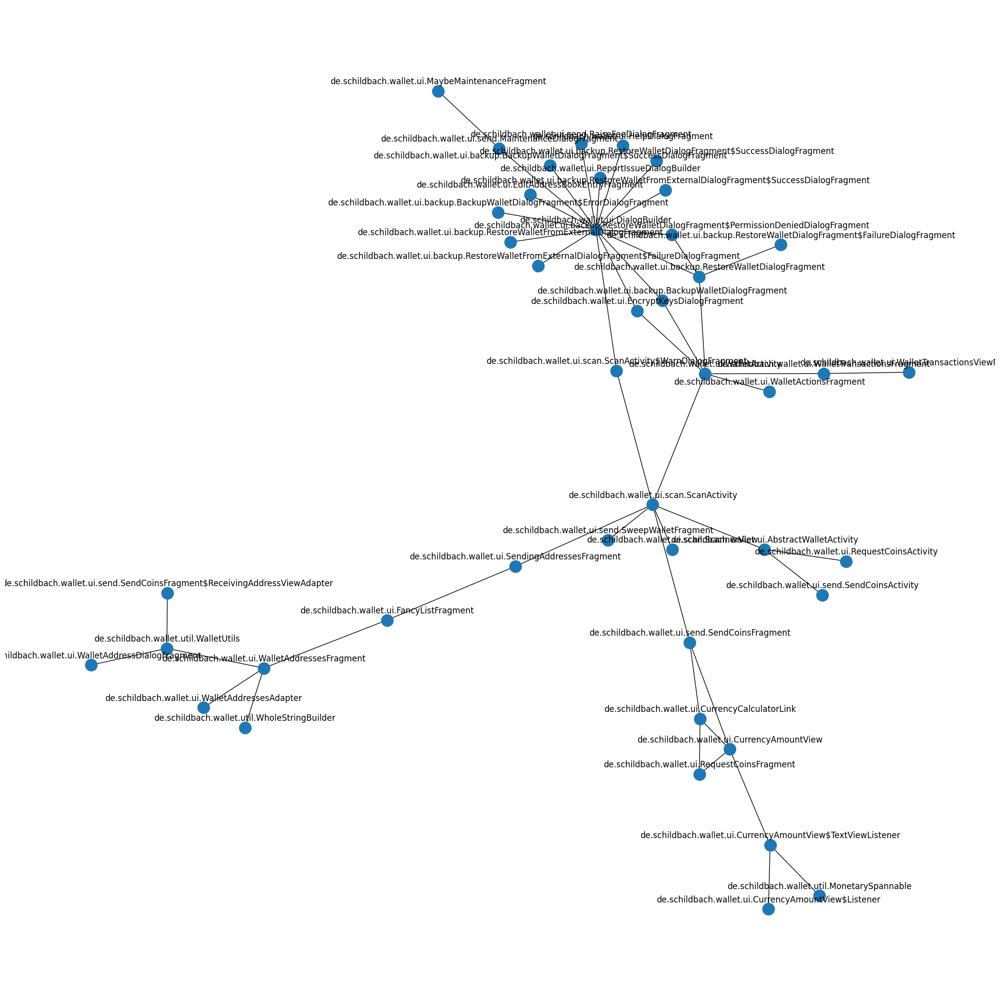

In [32]:
# Get the positions of the nodes
pos = nx.spring_layout(subgraph_1)

# Create a new dictionary for label positions
label_pos = {node: (x, y+0.02) for node, (x, y) in pos.items()}
plt.figure(figsize=(20, 20))
# Draw the subgraph
nx.draw(subgraph_1, pos, with_labels=False)
nx.draw_networkx_labels(subgraph_1, label_pos)

# Display the graph
plt.show()

In [66]:
louvain_coms = algorithms.louvain(subgraph_1, weight='weight', resolution=1., randomize=False)

Note: to be able to use all crisp methods, you need to install some additional packages:  {'infomap', 'leidenalg', 'wurlitzer', 'bayanpy', 'graph_tool'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'pyclustering', 'ASLPAw'}
Note: to be able to use all crisp methods, you need to install some additional packages:  {'leidenalg', 'infomap', 'wurlitzer'}


In [68]:
louvain_coms.method_name

'Louvain'

In [69]:
louvain_coms.method_parameters

{'weight': 'weight', 'resolution': 1.0, 'randomize': False}

In [70]:
louvain_coms.communities

[['de.schildbach.wallet.ui.HelpDialogFragment',
  'de.schildbach.wallet.ui.DialogBuilder',
  'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment',
  'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment',
  'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
  'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment',
  'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment',
  'de.schildbach.wallet.ui.send.MaintenanceDialogFragment',
  'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment',
  'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$SuccessDialogFragment'],
 ['de.schildbach.wallet.ui.SendingAddressesFragment',
  'de.schildbach.wallet.ui.WalletAddressDialo

In [86]:
features_louvain_coms = louvain_coms.communities

print(len(features_louvain_coms))

print(features_louvain_coms[0])

features_louvain_coms[0][0]

6
['de.schildbach.wallet.ui.HelpDialogFragment', 'de.schildbach.wallet.ui.DialogBuilder', 'de.schildbach.wallet.ui.EditAddressBookEntryFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment', 'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment', 'de.schildbach.wallet.ui.ReportIssueDialogBuilder', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment', 'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment', 'de.schildbach.wallet.ui.send.MaintenanceDialogFragment', 'de.schildbach.wallet.ui.MaybeMaintenanceFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment', 'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$SuccessDialogFragment']


'de.schildbach.wallet.ui.HelpDialogFragment'

In [71]:
louvain_coms.overlap

False

In [72]:
louvain_coms.node_coverage

1.0

In [73]:
louvain_coms.to_json()

'{"communities": [["de.schildbach.wallet.ui.HelpDialogFragment", "de.schildbach.wallet.ui.DialogBuilder", "de.schildbach.wallet.ui.EditAddressBookEntryFragment", "de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment", "de.schildbach.wallet.ui.send.RaiseFeeDialogFragment", "de.schildbach.wallet.ui.ReportIssueDialogBuilder", "de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment", "de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment", "de.schildbach.wallet.ui.send.MaintenanceDialogFragment", "de.schildbach.wallet.ui.MaybeMaintenanceFragment", "de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment", "de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment", "de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$SuccessDialogFragment"], ["de.schildbach.wallet.ui.SendingAddressesFragment", "de.schildbach.wallet.ui.WalletAddressDialogFragment"

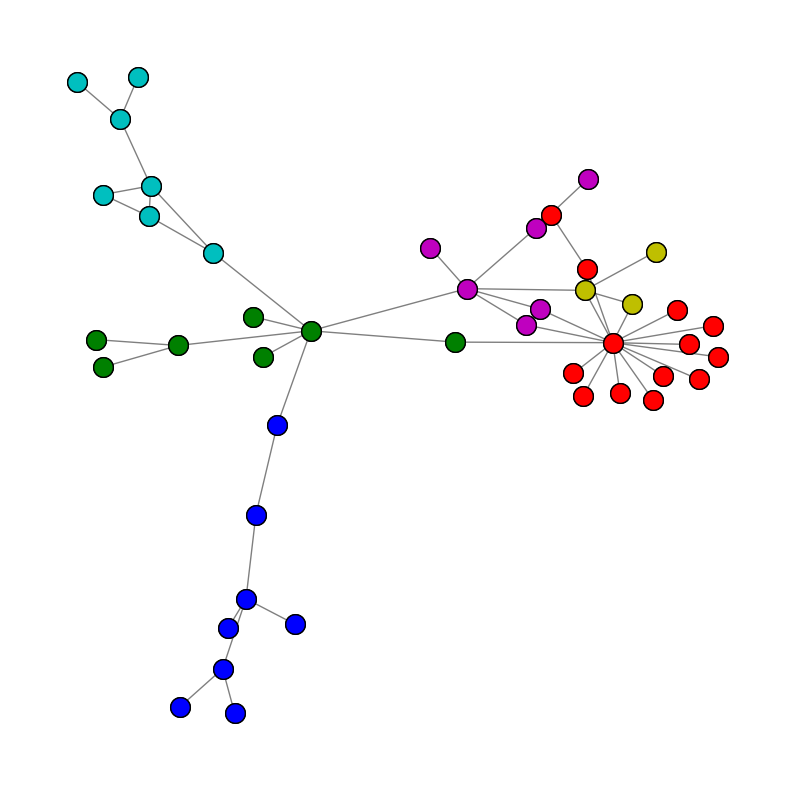

In [75]:
pos = nx.spring_layout(subgraph_1)
viz.plot_network_clusters(subgraph_1, louvain_coms, pos, figsize=(10, 10))

In [18]:
weighted_edges_list = [(edge['source'], edge['target'], edge['properties']['weight']) for edge in lifting_edges]

weighted_edges_list

[('de.schildbach.wallet.ui.SendingAddressesFragment',
  'de.schildbach.wallet.ui.scan.ScanActivity',
  1),
 ('de.schildbach.wallet.ui.RequestCoinsFragment',
  'de.schildbach.wallet.ui.CurrencyCalculatorLink',
  2),
 ('de.schildbach.wallet.ui.send.SendCoinsFragment',
  'de.schildbach.wallet.ui.scan.ScanActivity',
  1),
 ('de.schildbach.wallet.ui.HelpDialogFragment',
  'de.schildbach.wallet.ui.DialogBuilder',
  1),
 ('de.schildbach.wallet.ui.scan.ScanActivity',
  'de.schildbach.wallet.ui.scan.ScanActivity$WarnDialogFragment',
  2),
 ('de.schildbach.wallet.ui.WalletAddressDialogFragment',
  'de.schildbach.wallet.util.WalletUtils',
  1),
 ('de.schildbach.wallet.ui.WalletAddressesFragment',
  'de.schildbach.wallet.util.WholeStringBuilder',
  1),
 ('de.schildbach.wallet.ui.send.SendCoinsFragment$ReceivingAddressViewAdapter',
  'de.schildbach.wallet.util.WalletUtils',
  1),
 ('de.schildbach.wallet.ui.EditAddressBookEntryFragment',
  'de.schildbach.wallet.ui.DialogBuilder',
  2),
 ('de.schildb

In [19]:
# Create a new graph
G_2 = nx.Graph()

# Add weighted edges to the graph
# for edge in lifting_edges:
G_2.add_weighted_edges_from(weighted_edges_list)

# Find connected components
connected_components_w = [G_2.subgraph(c).copy() for c in nx.connected_components(G_2)]

# Now, connected_components is a list of sets, where each set is a connected component (i.e., a sublist of nodes that are connected to each other)
connected_components_w

In [20]:
# Sort components by greater size
sorted_list_ccw = []

for component in connected_components_w:
    sorted_list_ccw.append(list(component))
    sorted_list_ccw = sorted(sorted_list_ccw, key=len, reverse=True)
	
for i, component in enumerate(sorted_list_ccw):
	print(f"Feature {i+1}: {len(component)}")
    
sorted_list_ccw

Feature 1: 44
Feature 2: 3
Feature 3: 2
Feature 4: 2
Feature 5: 2


[['de.schildbach.wallet.ui.SendingAddressesFragment',
  'de.schildbach.wallet.ui.scan.ScanActivity',
  'de.schildbach.wallet.ui.RequestCoinsFragment',
  'de.schildbach.wallet.ui.CurrencyCalculatorLink',
  'de.schildbach.wallet.ui.send.SendCoinsFragment',
  'de.schildbach.wallet.ui.HelpDialogFragment',
  'de.schildbach.wallet.ui.DialogBuilder',
  'de.schildbach.wallet.ui.scan.ScanActivity$WarnDialogFragment',
  'de.schildbach.wallet.ui.WalletAddressDialogFragment',
  'de.schildbach.wallet.util.WalletUtils',
  'de.schildbach.wallet.ui.WalletAddressesFragment',
  'de.schildbach.wallet.util.WholeStringBuilder',
  'de.schildbach.wallet.ui.send.SendCoinsFragment$ReceivingAddressViewAdapter',
  'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment',
  'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment',
  'de.schildbach.wallet.ui.CurrencyAmountView',
  'de.schildbach.wallet.ui.CurrencyAmountView$TextViewLi

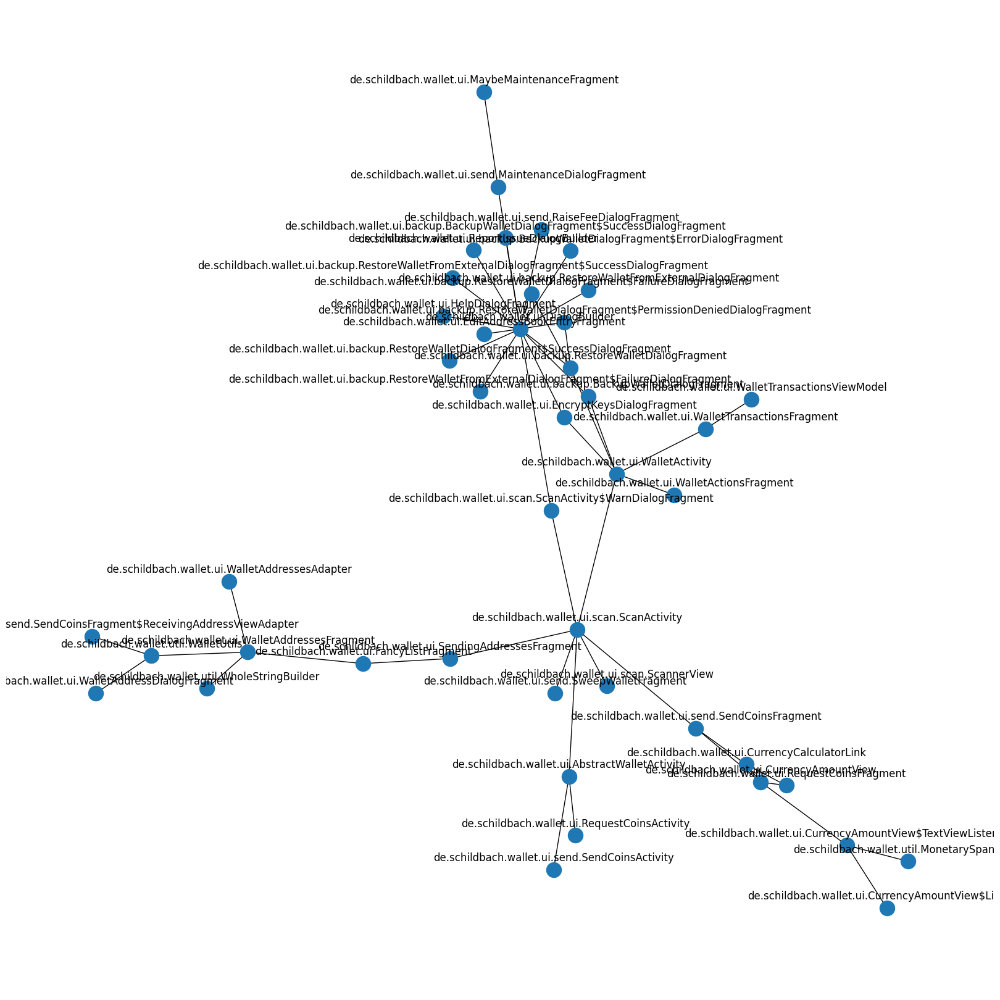

In [22]:
# subgraph_w = G_2.subgraph(sorted_components_w[0])

# Get the positions of the nodes
pos = nx.spring_layout(connected_components_w[0])

# Create a new dictionary for label positions
label_pos = {node: (x, y+0.02) for node, (x, y) in pos.items()}
plt.figure(figsize=(16, 16))
# Draw the subgraph
nx.draw(connected_components_w[0], pos, with_labels=False)
nx.draw_networkx_labels(connected_components_w[0], label_pos)

# Display the graph
plt.show()

In [23]:
print(connected_components_w[0].edges(data=True))

[('de.schildbach.wallet.ui.SendingAddressesFragment', 'de.schildbach.wallet.ui.scan.ScanActivity', {'weight': 1}), ('de.schildbach.wallet.ui.SendingAddressesFragment', 'de.schildbach.wallet.ui.FancyListFragment', {'weight': 2}), ('de.schildbach.wallet.ui.scan.ScanActivity', 'de.schildbach.wallet.ui.send.SendCoinsFragment', {'weight': 1}), ('de.schildbach.wallet.ui.scan.ScanActivity', 'de.schildbach.wallet.ui.scan.ScanActivity$WarnDialogFragment', {'weight': 2}), ('de.schildbach.wallet.ui.scan.ScanActivity', 'de.schildbach.wallet.ui.WalletActivity', {'weight': 1}), ('de.schildbach.wallet.ui.scan.ScanActivity', 'de.schildbach.wallet.ui.AbstractWalletActivity', {'weight': 1}), ('de.schildbach.wallet.ui.scan.ScanActivity', 'de.schildbach.wallet.ui.send.SweepWalletFragment', {'weight': 1}), ('de.schildbach.wallet.ui.scan.ScanActivity', 'de.schildbach.wallet.ui.scan.ScannerView', {'weight': 1}), ('de.schildbach.wallet.ui.RequestCoinsFragment', 'de.schildbach.wallet.ui.CurrencyCalculatorLink'

In [24]:
louvain_coms_w = algorithms.louvain(connected_components_w[0], weight='weight', resolution=1., randomize=False)

louvain_coms_w.to_json()

'{"communities": [["de.schildbach.wallet.ui.HelpDialogFragment", "de.schildbach.wallet.ui.DialogBuilder", "de.schildbach.wallet.ui.EditAddressBookEntryFragment", "de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment", "de.schildbach.wallet.ui.send.RaiseFeeDialogFragment", "de.schildbach.wallet.ui.ReportIssueDialogBuilder", "de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment", "de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment", "de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment", "de.schildbach.wallet.ui.send.MaintenanceDialogFragment", "de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment", "de.schildbach.wallet.ui.MaybeMaintenanceFragment", "de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment", "de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment", "de.schildbach.wallet.ui.backup.RestoreWalletFro

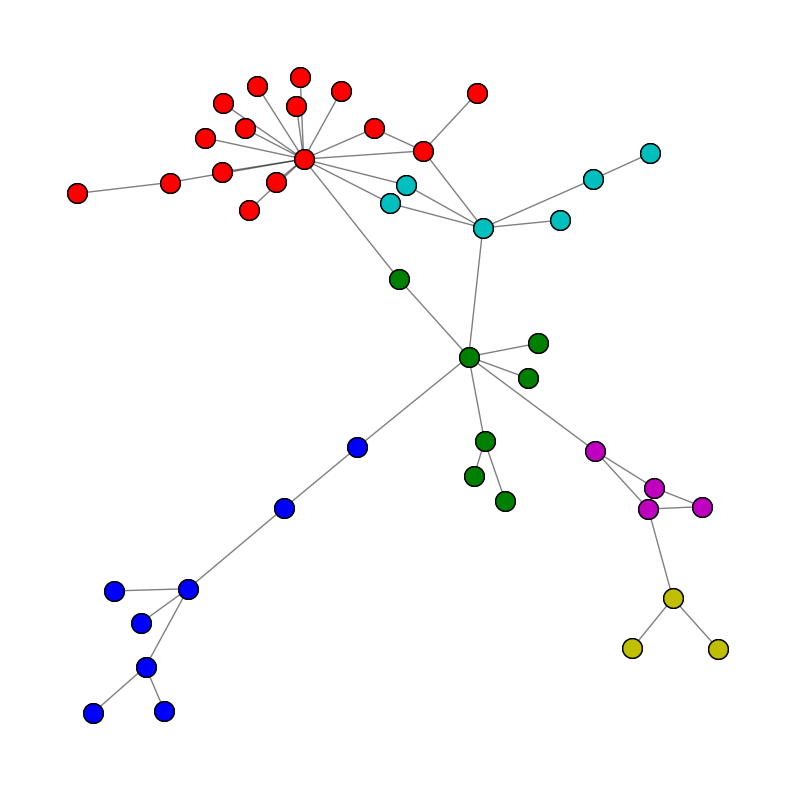

In [27]:
pos = nx.spring_layout(connected_components_w[0])
viz.plot_network_clusters(connected_components_w[0], louvain_coms_w, pos, figsize=(10, 10))

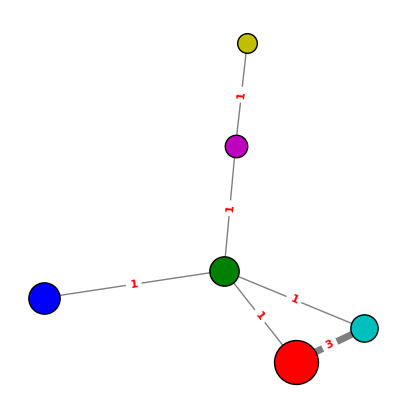

In [28]:
viz.plot_community_graph(connected_components_w[0], louvain_coms_w, figsize=(5, 5))

In [29]:
features_louvain_coms_w = louvain_coms_w.communities

print(len(features_louvain_coms_w))

print(len(features_louvain_coms_w[0]), features_louvain_coms_w[0])

print(features_louvain_coms_w[0][0])

6
16 ['de.schildbach.wallet.ui.HelpDialogFragment', 'de.schildbach.wallet.ui.DialogBuilder', 'de.schildbach.wallet.ui.EditAddressBookEntryFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment', 'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment', 'de.schildbach.wallet.ui.ReportIssueDialogBuilder', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment', 'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment', 'de.schildbach.wallet.ui.send.MaintenanceDialogFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment', 'de.schildbach.wallet.ui.MaybeMaintenanceFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment', 'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDial

In [48]:
leiden_coms_w = algorithms.leiden(connected_components_w[0], weights='weight')

leiden_coms_w.to_json()

'{"communities": [["de.schildbach.wallet.ui.HelpDialogFragment", "de.schildbach.wallet.ui.DialogBuilder", "de.schildbach.wallet.ui.EditAddressBookEntryFragment", "de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment", "de.schildbach.wallet.ui.send.RaiseFeeDialogFragment", "de.schildbach.wallet.ui.ReportIssueDialogBuilder", "de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment", "de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment", "de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment", "de.schildbach.wallet.ui.send.MaintenanceDialogFragment", "de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment", "de.schildbach.wallet.ui.MaybeMaintenanceFragment", "de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment", "de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment", "de.schildbach.wallet.ui.backup.RestoreWalletFro

In [49]:
leiden_coms_w.communities = leiden_coms_w.communities[:6]

leiden_coms_w.communities

[['de.schildbach.wallet.ui.HelpDialogFragment',
  'de.schildbach.wallet.ui.DialogBuilder',
  'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment',
  'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment',
  'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
  'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment',
  'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment',
  'de.schildbach.wallet.ui.send.MaintenanceDialogFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment',
  'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
  'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment',
  'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment',
  'de.schildbach.wallet.ui.backup.Resto

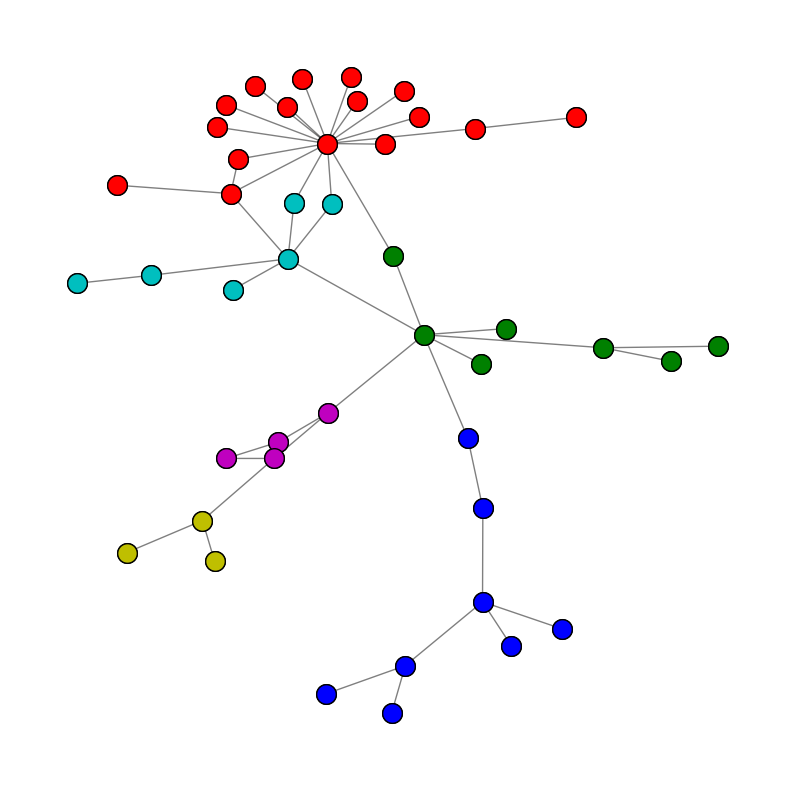

In [53]:
pos = nx.spring_layout(connected_components_w[0])
viz.plot_network_clusters(connected_components_w[0], leiden_coms_w, pos, figsize=(10, 10))

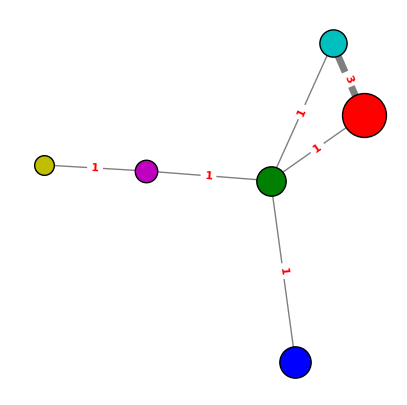

In [54]:
viz.plot_community_graph(connected_components_w[0], leiden_coms_w, figsize=(5, 5))

In [56]:
features_leiden_coms_w = leiden_coms_w.communities

print(len(features_leiden_coms_w))

print(len(features_leiden_coms_w[0]), features_leiden_coms_w[0])

print(features_leiden_coms_w[0][0])

6
16 ['de.schildbach.wallet.ui.HelpDialogFragment', 'de.schildbach.wallet.ui.DialogBuilder', 'de.schildbach.wallet.ui.EditAddressBookEntryFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment', 'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment', 'de.schildbach.wallet.ui.ReportIssueDialogBuilder', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment', 'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment', 'de.schildbach.wallet.ui.send.MaintenanceDialogFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment', 'de.schildbach.wallet.ui.MaybeMaintenanceFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment', 'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment', 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDial

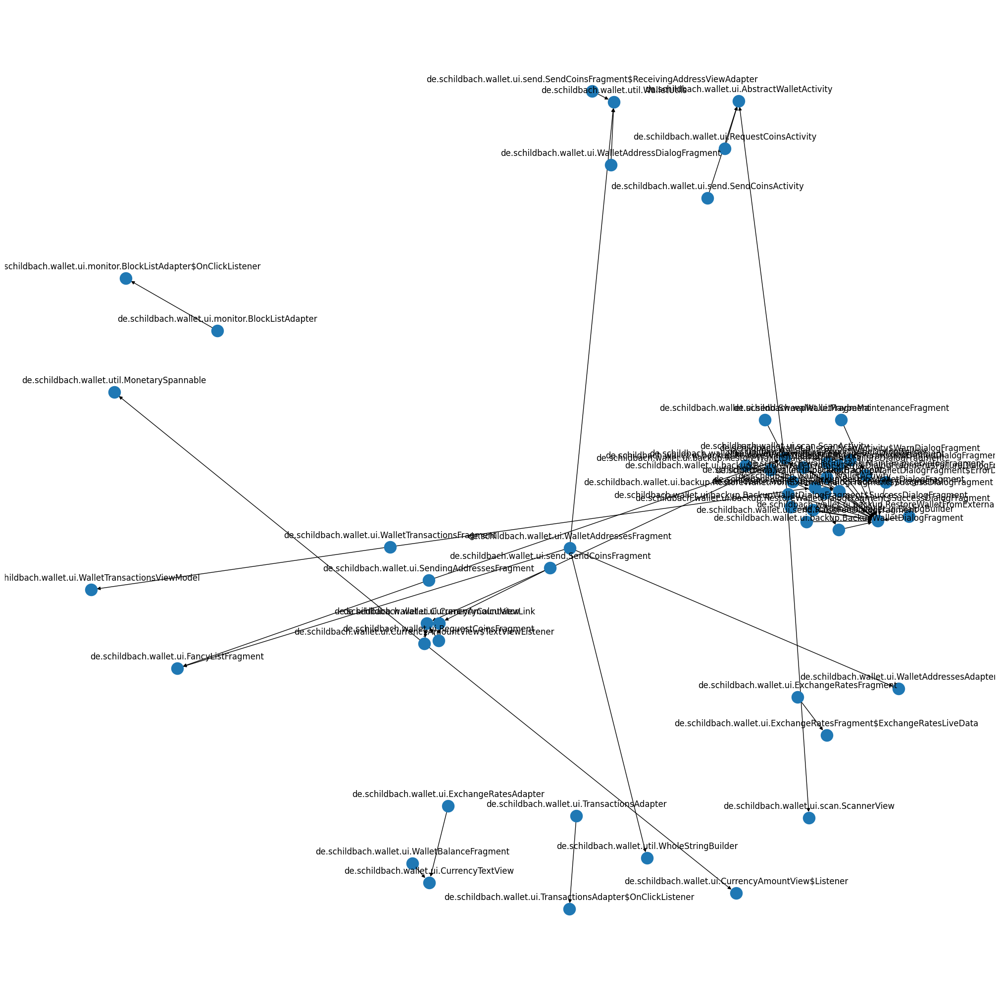

In [65]:
# Create a Multi Directed Graph
G_mdi = nx.MultiDiGraph()

# Add edges
# for edge in lifting_edges:
G_mdi.add_weighted_edges_from(weighted_edges_list)

# # Find strongly connected components
# scc = list(nx.strongly_connected_components(G_mdi))
# 
# # Print strongly connected components
# for component in scc:
#     print(component)
    
# for layer, nodes in enumerate(nx.topological_generations(G_mdi)):
#     # `multipartite_layout` expects the layer as a node attribute, so add the
#     # numeric layer value as a node attribute
#     for node in nodes:
#         G_mdi.nodes[node]["layer"] = layer
# 
# # Compute the multipartite_layout using the "layer" node attribute
# pos = nx.multipartite_layout(G_mdi, subset_key="layer")
# 
# fig, ax = plt.subplots()
# nx.draw_networkx(G_mdi, pos=pos, ax=ax)
# ax.set_title("DAG layout in topological order")
# fig.tight_layout()
# plt.show()

# Compute the spring layout positions
pos = nx.spring_layout(G_mdi)

# # Draw the graph using the spring layout
# nx.draw(G_mdi, pos, with_labels=True, arrows=True)

# Create a new dictionary for label positions
label_pos = {node: (x, y+0.02) for node, (x, y) in pos.items()}
plt.figure(figsize=(20, 20))
# Draw the subgraph
nx.draw(G_mdi, pos) #, with_labels=False)
nx.draw_networkx_labels(G_mdi, label_pos)

plt.show()

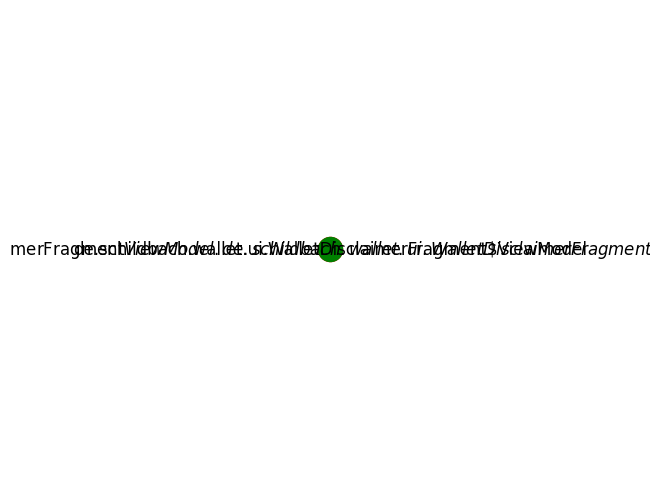

In [29]:
# Assuming that 'G' is your graph and 'connected_components' are the connected components you have computed

# Create a color map
colors = ['r', 'g', 'b', 'c', 'm', 'y', 'k']

# Draw each of the largest components separately
for i, component in enumerate(sorted_components_1[30]):
    # Create a subgraph for this component and draw it
    subgraph = G.subgraph(component)
    nx.draw(subgraph, node_color=colors[i % len(colors)], with_labels=True)

plt.show()

In [31]:
# p2_edges_list = []
# # for key in edges.keys(): 
# p2_edges_list += p_edges_list + edges_lyr['accepts'] + edges_lyr['returns'] # + edges_lyr['constructs'] edges[key]
# p2_edges_list

KeyError: 'accepts'

In [32]:
p2_edges_list = []
for key in edges_lyr.keys(): 
	p2_edges_list += edges_lyr[key]
p2_edges_list

[{'id': '72fe929b625bb29f983f38a0f208ece6',
  'source': 'de.schildbach.wallet.ui.WalletTransactionsFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater)',
  'label': 'hasParameter',
  'properties': {'weight': 1, 'metaSrc': 'source code'},
  'target': 'de.schildbach.wallet.ui.WalletTransactionsFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).menu'},
 {'id': '11ac321a8a9254f6039f2b93105a0692',
  'source': 'de.schildbach.wallet.service.BlockchainService$NewTransactionLiveData$WalletListener.onCoinsSent(org.bitcoinj.wallet.Wallet,org.bitcoinj.core.Transaction,org.bitcoinj.core.Coin,org.bitcoinj.core.Coin)',
  'label': 'hasParameter',
  'properties': {'weight': 1, 'metaSrc': 'source code'},
  'target': 'de.schildbach.wallet.service.BlockchainService$NewTransactionLiveData$WalletListener.onCoinsSent(org.bitcoinj.wallet.Wallet,org.bitcoinj.core.Transaction,org.bitcoinj.core.Coin,org.bitcoinj.core.Coin).tx'},
 {'id': 'c0fc525b77ac0ea67f0bea01658eae9

In [33]:
len(p2_edges_list)

7227

In [34]:
p2_edges_list[0]

{'id': '72fe929b625bb29f983f38a0f208ece6',
 'source': 'de.schildbach.wallet.ui.WalletTransactionsFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater)',
 'label': 'hasParameter',
 'properties': {'weight': 1, 'metaSrc': 'source code'},
 'target': 'de.schildbach.wallet.ui.WalletTransactionsFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).menu'}

In [35]:
presentation_layer_edges_2 = extract_edges(p2_edges_list, presentation_layer_nodes)

len(presentation_layer_edges_2), presentation_layer_edges_2

(122,
 [{'id': 'b81cca3fef4c66f9d0d74f07ecce88eb',
   'source': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.requestFocus()',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.activeTextView()'},
  {'id': 'd5dd08b9e6e3db27a16f5f2599047ccb',
   'source': 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment.onRequestPermissionsResult(int,java.lang.String[],int[])',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment.showDialog(android.support.v4.app.FragmentManager)'},
  {'id': '299c3b9a9e6994003e0795a21d5fadba',
   'source': 'de.schildbach.wallet.ui.send.SendCoinsFragment.onPause()',
   'label': 'invokes',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.CurrencyCalculatorLink.setListener(de.schildbach.wallet.

In [124]:
# Create a new graph
G = nx.Graph()

# Add nodes to the graph
G.add_nodes_from(presentation_layer_nodes)

# Add edges to the graph
for edge in presentation_layer_edges_2:
    G.add_edge(edge['source'], edge['target'])

# Find connected components
connected_components_2 = list(nx.connected_components(G))

# Now, connected_components is a list of sets, where each set is a connected component (i.e., a sublist of nodes that are connected to each other)

In [125]:
len(connected_components_2), connected_components_2

(311,
 [{'de.schildbach.wallet.ui.WalletDisclaimerFragment.onCreate(android.os.Bundle)'},
  {'de.schildbach.wallet.ui.CurrencyAmountView.setContextButton(int,de.schildbach.wallet.ui.OnClickListener)'},
  {'de.schildbach.wallet.ui.WalletActivity.de.schildbach.wallet.ui.WalletActivity()'},
  {'de.schildbach.wallet.util.CheatSheet.remove(android.view.View)'},
  {'de.schildbach.wallet.ui.monitor.NetworkMonitorActivity$PagerAdapter.de.schildbach.wallet.ui.monitor.NetworkMonitorActivity$PagerAdapter(android.support.v4.app.FragmentManager)'},
  {'de.schildbach.wallet.ui.CurrencySymbolDrawable.draw(android.graphics.Canvas)'},
  {'de.schildbach.wallet.ui.ExchangeRatesAdapter.de.schildbach.wallet.ui.ExchangeRatesAdapter(android.content.Context,de.schildbach.wallet.ui.ExchangeRatesAdapter$OnClickListener)'},
  {'de.schildbach.wallet.ui.AbstractWalletActivity.onOptionsItemSelected(android.view.MenuItem)',
   'de.schildbach.wallet.ui.DialogBuilder.setIcon(android.graphics.drawable.Drawable)',
   'd

In [126]:
len(connected_components_2[0]), connected_components_2[0]

(1,
 {'de.schildbach.wallet.ui.WalletDisclaimerFragment.onCreate(android.os.Bundle)'})

In [127]:
# Sort components by greater size
sorted_components_2 = sorted(connected_components_2, key=len, reverse=True)

for i, component in enumerate(sorted_components_2):
	print(f"Feature {i+1}: {len(component)}")
	
sorted_components_2[0]

Feature 1: 46
Feature 2: 13
Feature 3: 8
Feature 4: 6
Feature 5: 5
Feature 6: 5
Feature 7: 5
Feature 8: 5
Feature 9: 4
Feature 10: 3
Feature 11: 3
Feature 12: 3
Feature 13: 3
Feature 14: 2
Feature 15: 2
Feature 16: 2
Feature 17: 2
Feature 18: 2
Feature 19: 2
Feature 20: 2
Feature 21: 2
Feature 22: 2
Feature 23: 2
Feature 24: 2
Feature 25: 2
Feature 26: 2
Feature 27: 2
Feature 28: 2
Feature 29: 2
Feature 30: 1
Feature 31: 1
Feature 32: 1
Feature 33: 1
Feature 34: 1
Feature 35: 1
Feature 36: 1
Feature 37: 1
Feature 38: 1
Feature 39: 1
Feature 40: 1
Feature 41: 1
Feature 42: 1
Feature 43: 1
Feature 44: 1
Feature 45: 1
Feature 46: 1
Feature 47: 1
Feature 48: 1
Feature 49: 1
Feature 50: 1
Feature 51: 1
Feature 52: 1
Feature 53: 1
Feature 54: 1
Feature 55: 1
Feature 56: 1
Feature 57: 1
Feature 58: 1
Feature 59: 1
Feature 60: 1
Feature 61: 1
Feature 62: 1
Feature 63: 1
Feature 64: 1
Feature 65: 1
Feature 66: 1
Feature 67: 1
Feature 68: 1
Feature 69: 1
Feature 70: 1
Feature 71: 1
Feature 72: 1

{'de.schildbach.wallet.ui.AbstractWalletActivity.onOptionsItemSelected(android.view.MenuItem)',
 'de.schildbach.wallet.ui.DialogBuilder.setIcon(android.graphics.drawable.Drawable)',
 'de.schildbach.wallet.ui.DialogBuilder.setMessage(java.lang.CharSequence)',
 'de.schildbach.wallet.ui.DialogBuilder.setTitle(int)',
 'de.schildbach.wallet.ui.DialogBuilder.setTitle(java.lang.CharSequence)',
 'de.schildbach.wallet.ui.DialogBuilder.singleDismissButton(android.content.DialogInterface.OnClickListener)',
 'de.schildbach.wallet.ui.DialogBuilder.warn(android.content.Context,int)',
 'de.schildbach.wallet.ui.EditAddressBookEntryFragment.onCreateDialog(android.os.Bundle)',
 'de.schildbach.wallet.ui.EncryptKeysDialogFragment.onCreateDialog(android.os.Bundle)',
 'de.schildbach.wallet.ui.EncryptKeysDialogFragment.show(android.support.v4.app.FragmentManager)',
 'de.schildbach.wallet.ui.HelpDialogFragment.onCreateDialog(android.os.Bundle)',
 'de.schildbach.wallet.ui.HelpDialogFragment.page(android.suppor

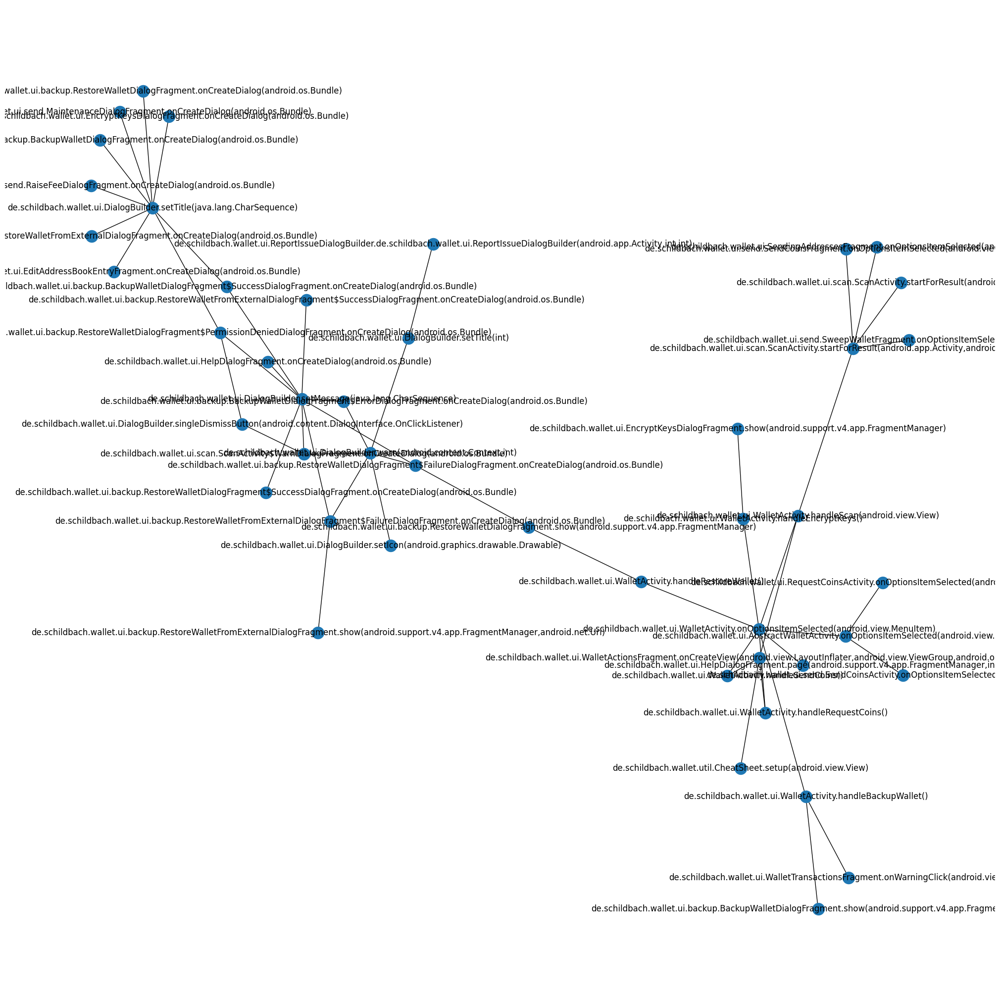

In [128]:
# Create a subgraph from the first connected component
subgraph_2 = G.subgraph(sorted_components_2[0])

plt.figure(figsize=(20, 20))  # Increase the figure size
nx.draw(subgraph_2, with_labels=True)
plt.show()

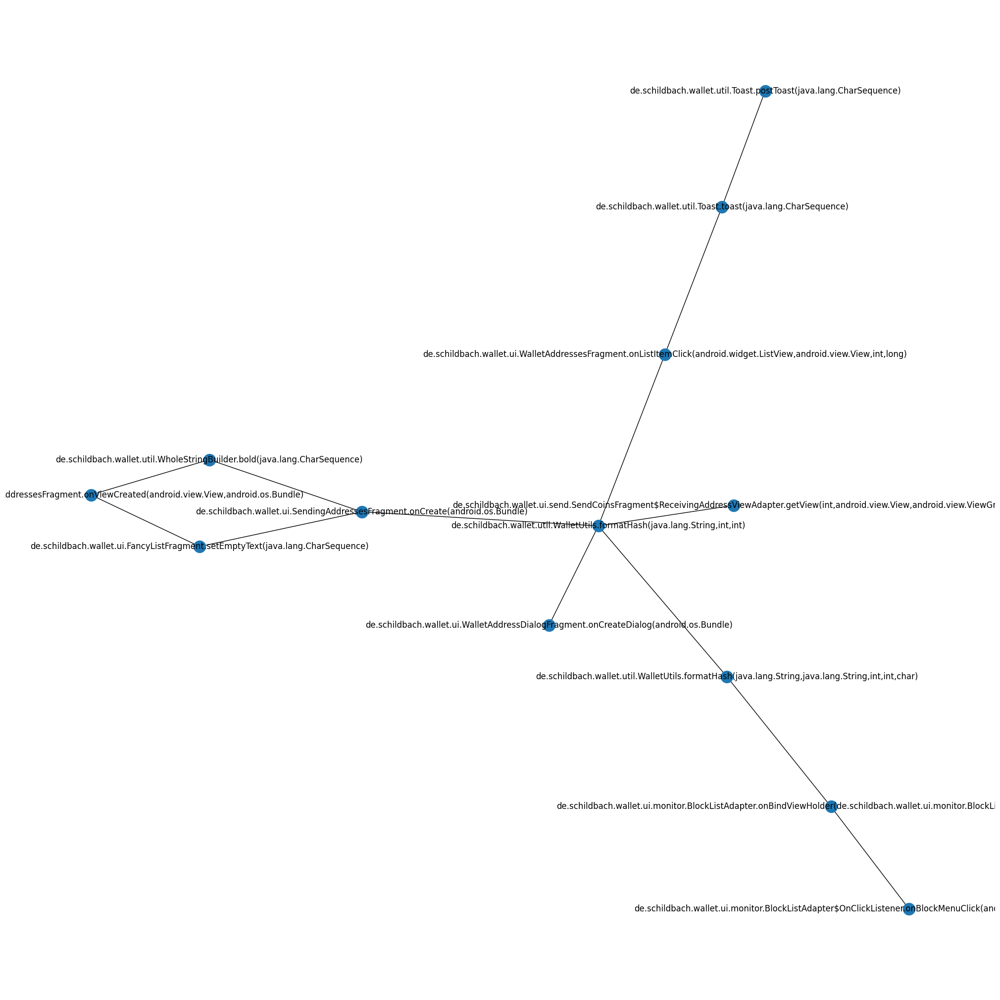

In [129]:
# Create a subgraph from the first connected component
subgraph_3 = G.subgraph(sorted_components_2[1])

plt.figure(figsize=(20, 20))  # Increase the figure size
nx.draw(subgraph_3, with_labels=True)
plt.show()

## Using summary json

In [57]:
ifile_sum = f'../../test/1-code-summarization-output/{project_name}-with-summaries.json'
graph_sum = read_json_file(ifile_sum)
nodes_sum,edges_sum = transform_graph(graph_sum)

len(nodes_sum), nodes_sum

(3999,
 {'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater': {'id': 'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater',
   'properties': {'simpleName': 'inflater',
    'qualifiedName': 'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater',
    'kind': 'parameter',
    'metaSrc': 'source code'},
   'labels': ['Variable']},
  'de.schildbach.wallet.ui.TransactionsAdapter.de.schildbach.wallet.ui.TransactionsAdapter(android.content.Context,int,de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener).context': {'id': 'de.schildbach.wallet.ui.TransactionsAdapter.de.schildbach.wallet.ui.TransactionsAdapter(android.content.Context,int,de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener).context',
   'properties': {'simpleName': 'context',
    'qualifiedName': 'de.schildbach.wa

In [63]:
nodes_sum['de.schildbach.wallet.ui.RequestCoinsFragment']['properties']['description']['Responsibility']

'User Interfacer'

In [62]:
nodes_sum.values()

dict_values([{'id': 'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater', 'properties': {'simpleName': 'inflater', 'qualifiedName': 'de.schildbach.wallet.ui.WalletBalanceFragment.onCreateOptionsMenu(android.view.Menu,android.view.MenuInflater).inflater', 'kind': 'parameter', 'metaSrc': 'source code'}, 'labels': ['Variable']}, {'id': 'de.schildbach.wallet.ui.TransactionsAdapter.de.schildbach.wallet.ui.TransactionsAdapter(android.content.Context,int,de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener).context', 'properties': {'simpleName': 'context', 'qualifiedName': 'de.schildbach.wallet.ui.TransactionsAdapter.de.schildbach.wallet.ui.TransactionsAdapter(android.content.Context,int,de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener).context', 'kind': 'parameter', 'metaSrc': 'source code'}, 'labels': ['Variable']}, {'id': 'de.schildbach.wallet.ui.WalletDisclaimerFragment.onCreate(android.os.Bundle)', 'pr

In [80]:
p_layer_nodes_sum_data = [node_data for node_id, node_data in nodes_sum.items() if 'description' in node_data['properties'] and 'Layer' in node_data['properties']['description'] and node_data['properties']['description']['Layer'] == 'Presentation Layer']

p_layer_nodes_sum_data

[{'id': 'de.schildbach.wallet.ui.WalletTransactionsFragment',
  'properties': {'docComment': '\r\n@author Andreas Schildbach\r\n',
   'simpleName': 'WalletTransactionsFragment',
   'qualifiedName': 'de.schildbach.wallet.ui.WalletTransactionsFragment',
   'kind': 'class',
   'metaSrc': 'source code',
   'description': {'Role-Stereotype': 'Presentation Layer',
    'Layer': 'Presentation Layer',
    'Responsibility': 'The WalletTransactionsFragment class is responsible for managing the user interface related to displaying wallet transactions. It handles user interactions, updates views based on transaction data, and provides functionality for filtering and interacting with transactions. The class also sets up observers for transaction data, creates adapters for displaying transactions efficiently, and handles menu options for filtering transactions. Additionally, it manages warning messages and handles click events on transactions and warning views to trigger specific actions. Overall, th

In [81]:
len(p_layer_nodes_sum_data)

73

In [60]:
p_layer_nodes_sum_id = [node_id for node_id, node_data in nodes_sum.items() if 'description' in node_data['properties'] and 'Layer' in node_data['properties']['description'] and node_data['properties']['description']['Layer'] == 'Presentation Layer']

p_layer_nodes_sum_id

['de.schildbach.wallet.ui.WalletTransactionsFragment',
 'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment',
 'de.schildbach.wallet.util.ViewPagerTabs',
 'de.schildbach.wallet.ui.backup.ImportDialogButtonEnablerListener',
 'de.schildbach.wallet.ui.preference.AboutFragment',
 'de.schildbach.wallet.ui.monitor.BlockListFragment',
 'de.schildbach.wallet.ui.WalletActionsFragment',
 'de.schildbach.wallet.ui.monitor.BlockListAdapter',
 'de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener',
 'de.schildbach.wallet.ui.HelpDialogFragment',
 'de.schildbach.wallet.ui.monitor.BlockListAdapter$OnClickListener',
 'de.schildbach.wallet.ui.scan.ScannerView',
 'de.schildbach.wallet.ui.WalletDisclaimerFragment',
 'de.schildbach.wallet.ui.ExchangeRatesAdapter',
 'de.schildbach.wallet.ui.TransactionsAdapter$WarningViewHolder',
 'de.schildbach.wallet.ui.ExchangeRatesAdapter$OnClickListener',
 'de.schildbach.wallet.ui.FancyListFragment',
 'de.schildbach.wallet.ui.monitor',
 'de.schildbach.wall

In [61]:
len(p_layer_nodes_sum_id)

73

In [56]:
p_edges_list_sum = []
# for key in edges.keys(): 
p_edges_list_sum += edges_sum['contains'] + edges_sum['hasScript'] + edges_sum['invokes'] # edges[key]
p_edges_list_sum

[{'id': '14035a62aefc17bbf3ebde4c89c2a108',
  'source': 'de.schildbach.wallet',
  'label': 'contains',
  'properties': {'weight': 1, 'metaSrc': 'source code'},
  'target': 'de.schildbach.wallet.ui'},
 {'id': '94d1142fdafeeea252421e5f3d60a081',
  'source': 'de.schildbach.wallet.ui',
  'label': 'contains',
  'properties': {'weight': 1, 'metaSrc': 'source code'},
  'target': 'de.schildbach.wallet.ui.EncryptKeysDialogFragment'},
 {'id': 'aa704992d555c05cbda28431e2a38aac',
  'source': 'de.schildbach.wallet.ui.scan',
  'label': 'contains',
  'properties': {'weight': 1, 'metaSrc': 'source code'},
  'target': 'de.schildbach.wallet.ui.scan.ScanActivity'},
 {'id': '5f1735bfcd0193eae440213fca4b55a7',
  'source': 'de.schildbach.wallet.ui.monitor',
  'label': 'contains',
  'properties': {'weight': 1, 'metaSrc': 'source code'},
  'target': 'de.schildbach.wallet.ui.monitor.PeerListFragment$HostnamesLiveData'},
 {'id': '51ffda58e93b22d16ee775f682876018',
  'source': 'de.schildbach.wallet.util',
  'lab

In [57]:
len(p_edges_list_sum)

2767

In [62]:
p_layer_edges_sum_1 = extract_edges(p_edges_list_sum, p_layer_nodes_sum_id)

len(p_layer_edges_sum_1), p_layer_edges_sum_1

(68,
 [{'id': '33b56a00c6406a77617a2780d20e5202',
   'source': 'de.schildbach.wallet.ui.scan',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.scan.ScanActivity$WarnDialogFragment'},
  {'id': 'db4e0cb3750a297c82411078af89f2e5',
   'source': 'de.schildbach.wallet.ui.monitor',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.monitor.NetworkMonitorActivity'},
  {'id': 'f11ce61bab7617ca83f46131446c4fb6',
   'source': 'de.schildbach.wallet.ui',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.CircularProgressView'},
  {'id': '1dfb498c17011a01428cca78ff017df0',
   'source': 'de.schildbach.wallet.ui.backup',
   'label': 'contains',
   'properties': {'weight': 1, 'metaSrc': 'source code'},
   'target': 'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$SuccessDia

In [65]:
# Create a new graph
G = nx.Graph()

# Add nodes to the graph
G.add_nodes_from(p_layer_nodes_sum_id)

# Add edges to the graph
for edge in p_layer_edges_sum_1:
    G.add_edge(edge['source'], edge['target'])

# Find connected components
connected_components_sum = list(nx.connected_components(G))

# Now, connected_components is a list of sets, where each set is a connected component (i.e., a sublist of nodes that are connected to each other)

In [67]:
len(connected_components_sum), connected_components_sum

(5,
 [{'de.schildbach.wallet.ui',
   'de.schildbach.wallet.ui.AddressBookActivity',
   'de.schildbach.wallet.ui.AddressBookActivity$TwoFragmentAdapter',
   'de.schildbach.wallet.ui.BitmapFragment',
   'de.schildbach.wallet.ui.CircularProgressView',
   'de.schildbach.wallet.ui.CurrencyAmountView',
   'de.schildbach.wallet.ui.CurrencyAmountView$Listener',
   'de.schildbach.wallet.ui.CurrencyAmountView$TextViewListener',
   'de.schildbach.wallet.ui.CurrencySymbolDrawable',
   'de.schildbach.wallet.ui.CurrencyTextView',
   'de.schildbach.wallet.ui.DialogBuilder',
   'de.schildbach.wallet.ui.ExchangeRatesActivity',
   'de.schildbach.wallet.ui.ExchangeRatesAdapter',
   'de.schildbach.wallet.ui.ExchangeRatesAdapter$OnClickListener',
   'de.schildbach.wallet.ui.ExchangeRatesAdapter$ViewHolder',
   'de.schildbach.wallet.ui.ExchangeRatesFragment',
   'de.schildbach.wallet.ui.FancyListFragment',
   'de.schildbach.wallet.ui.HelpDialogFragment',
   'de.schildbach.wallet.ui.MaybeMaintenanceFragment'

In [68]:
len(connected_components_sum[0]), connected_components_sum[0]

(69,
 {'de.schildbach.wallet.ui',
  'de.schildbach.wallet.ui.AddressBookActivity',
  'de.schildbach.wallet.ui.AddressBookActivity$TwoFragmentAdapter',
  'de.schildbach.wallet.ui.BitmapFragment',
  'de.schildbach.wallet.ui.CircularProgressView',
  'de.schildbach.wallet.ui.CurrencyAmountView',
  'de.schildbach.wallet.ui.CurrencyAmountView$Listener',
  'de.schildbach.wallet.ui.CurrencyAmountView$TextViewListener',
  'de.schildbach.wallet.ui.CurrencySymbolDrawable',
  'de.schildbach.wallet.ui.CurrencyTextView',
  'de.schildbach.wallet.ui.DialogBuilder',
  'de.schildbach.wallet.ui.ExchangeRatesActivity',
  'de.schildbach.wallet.ui.ExchangeRatesAdapter',
  'de.schildbach.wallet.ui.ExchangeRatesAdapter$OnClickListener',
  'de.schildbach.wallet.ui.ExchangeRatesAdapter$ViewHolder',
  'de.schildbach.wallet.ui.ExchangeRatesFragment',
  'de.schildbach.wallet.ui.FancyListFragment',
  'de.schildbach.wallet.ui.HelpDialogFragment',
  'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
  'de.schildbach

In [69]:
# Sort components by greater size
sorted_components_sum = sorted(connected_components_sum, key=len, reverse=True)

for i, component in enumerate(sorted_components_sum):
	print(f"Feature {i+1}: {len(component)}")
	
sorted_components_sum[0]

Feature 1: 69
Feature 2: 1
Feature 3: 1
Feature 4: 1
Feature 5: 1


{'de.schildbach.wallet.ui',
 'de.schildbach.wallet.ui.AddressBookActivity',
 'de.schildbach.wallet.ui.AddressBookActivity$TwoFragmentAdapter',
 'de.schildbach.wallet.ui.BitmapFragment',
 'de.schildbach.wallet.ui.CircularProgressView',
 'de.schildbach.wallet.ui.CurrencyAmountView',
 'de.schildbach.wallet.ui.CurrencyAmountView$Listener',
 'de.schildbach.wallet.ui.CurrencyAmountView$TextViewListener',
 'de.schildbach.wallet.ui.CurrencySymbolDrawable',
 'de.schildbach.wallet.ui.CurrencyTextView',
 'de.schildbach.wallet.ui.DialogBuilder',
 'de.schildbach.wallet.ui.ExchangeRatesActivity',
 'de.schildbach.wallet.ui.ExchangeRatesAdapter',
 'de.schildbach.wallet.ui.ExchangeRatesAdapter$OnClickListener',
 'de.schildbach.wallet.ui.ExchangeRatesAdapter$ViewHolder',
 'de.schildbach.wallet.ui.ExchangeRatesFragment',
 'de.schildbach.wallet.ui.FancyListFragment',
 'de.schildbach.wallet.ui.HelpDialogFragment',
 'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
 'de.schildbach.wallet.ui.ProgressDialog

In [78]:
# Create a subgraph from the first connected component
subgraph = G.subgraph(sorted_components_sum[0])

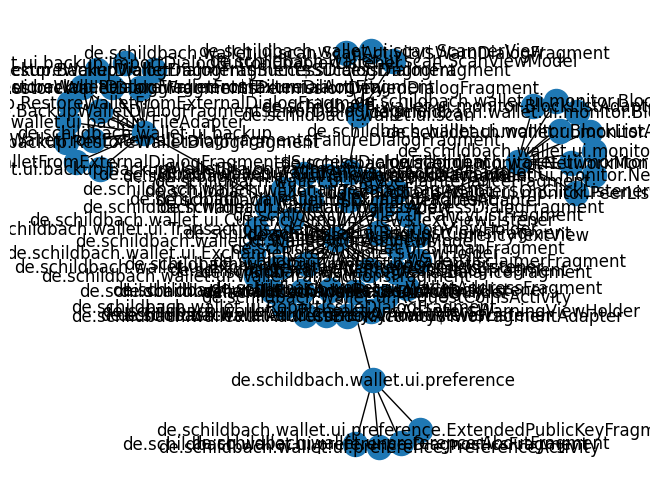

In [79]:
# Draw the subgraph
nx.draw(subgraph, with_labels=True)

# Display the graph
plt.show()

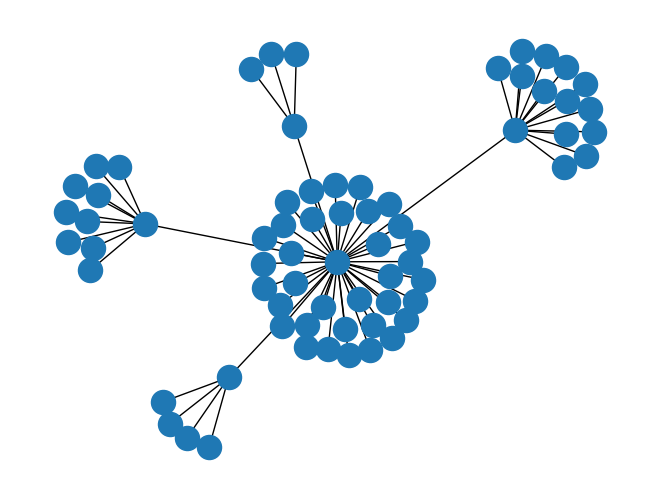

In [80]:
# Draw the subgraph
nx.draw(subgraph)

# Display the graph
plt.show()

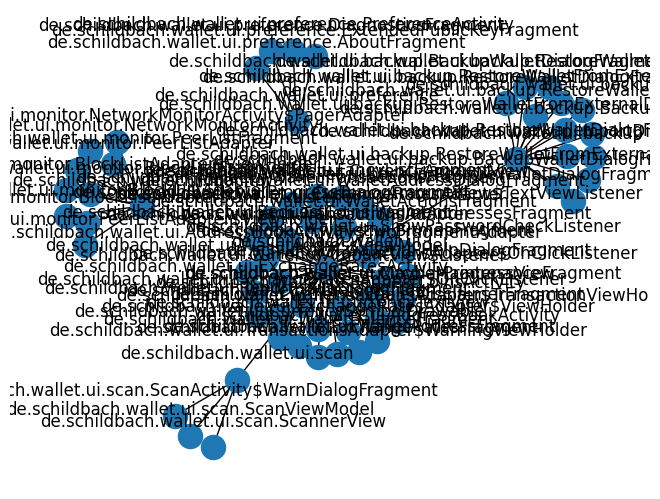

In [81]:
# Get the positions of the nodes
pos = nx.spring_layout(subgraph)

# Create a new dictionary for label positions
label_pos = {node: (x, y+0.1) for node, (x, y) in pos.items()}

# Draw the subgraph
nx.draw(subgraph, pos, with_labels=False)
nx.draw_networkx_labels(subgraph, label_pos)

# Display the graph
plt.show()

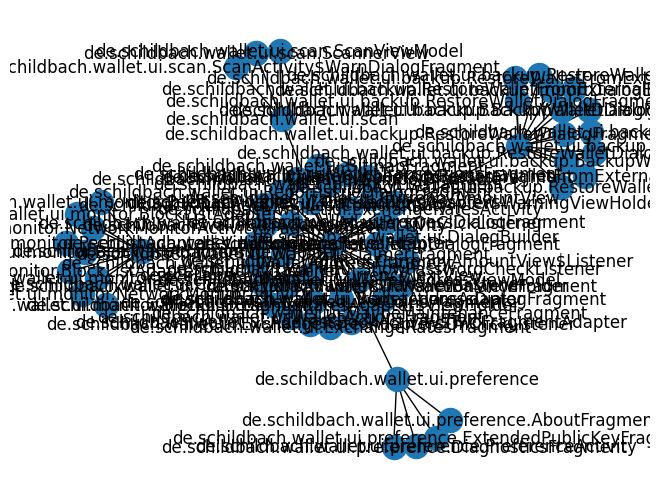

In [82]:
# spring_layout
pos = nx.spring_layout(subgraph)
nx.draw(subgraph, pos, with_labels=True)
plt.show()

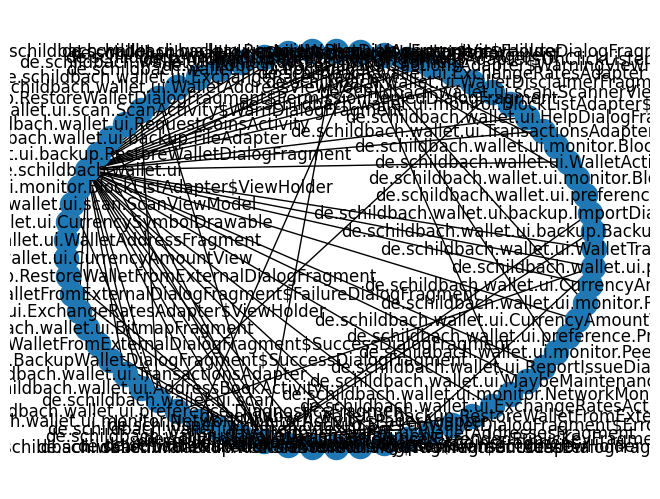

In [83]:
# circular_layout
pos = nx.circular_layout(subgraph)
nx.draw(subgraph, pos, with_labels=True)
plt.show()

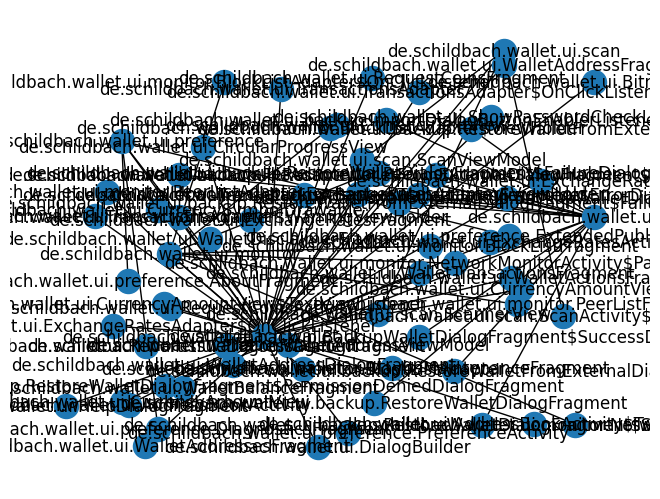

In [84]:
# random_layout
pos = nx.random_layout(subgraph)
nx.draw(subgraph, pos, with_labels=True)
plt.show()

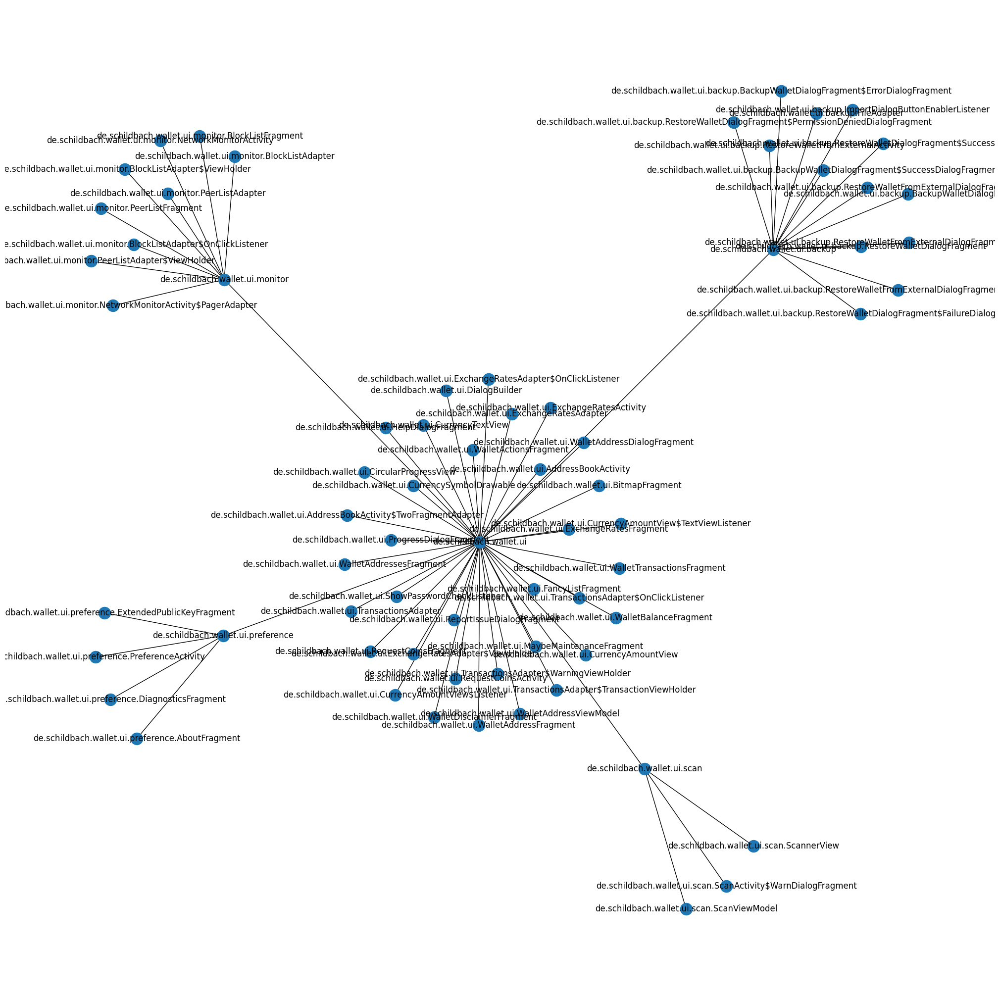

In [86]:
plt.figure(figsize=(20, 20))  # Increase the figure size
nx.draw(subgraph, with_labels=True)
plt.show()

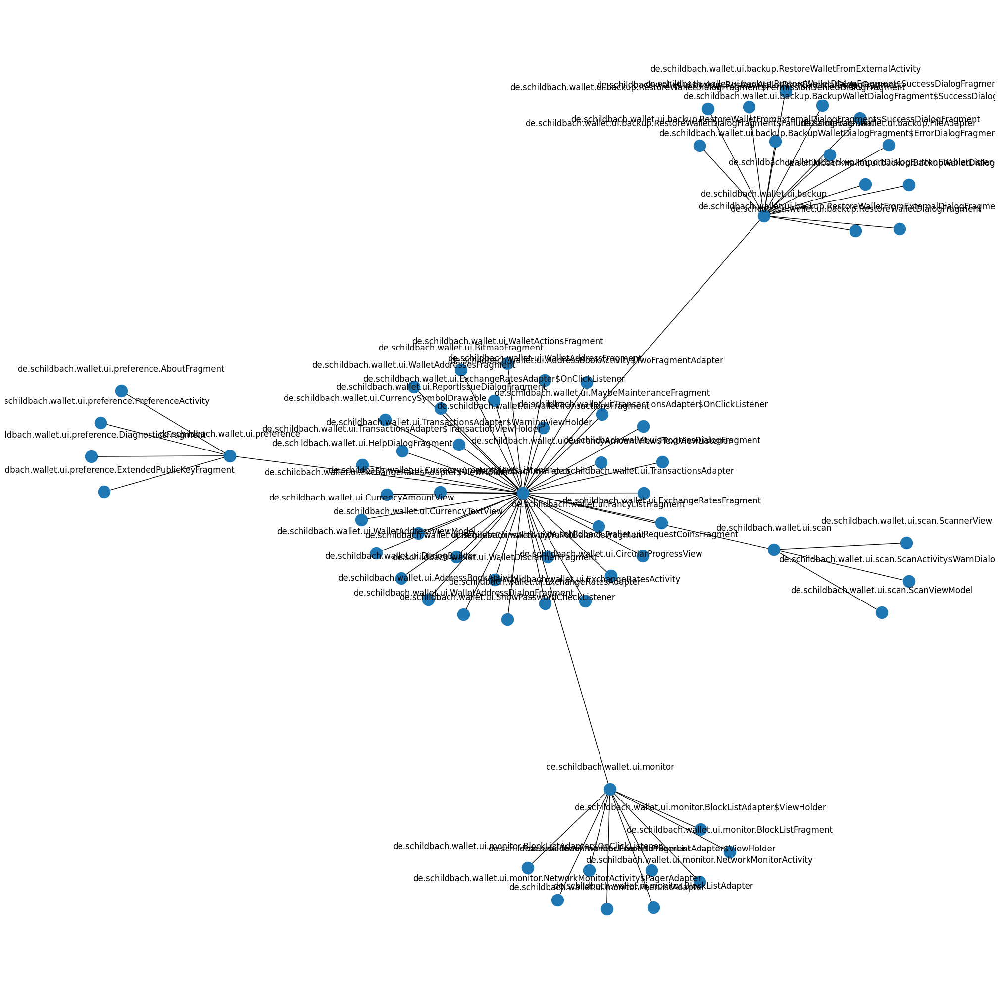

In [89]:
plt.figure(figsize=(20, 20))  # Increase the figure size
pos = nx.spring_layout(subgraph)
label_pos = {node: (x, y+0.05) for node, (x, y) in pos.items()}
nx.draw(subgraph, pos, with_labels=False)
nx.draw_networkx_labels(subgraph, label_pos)
plt.show()

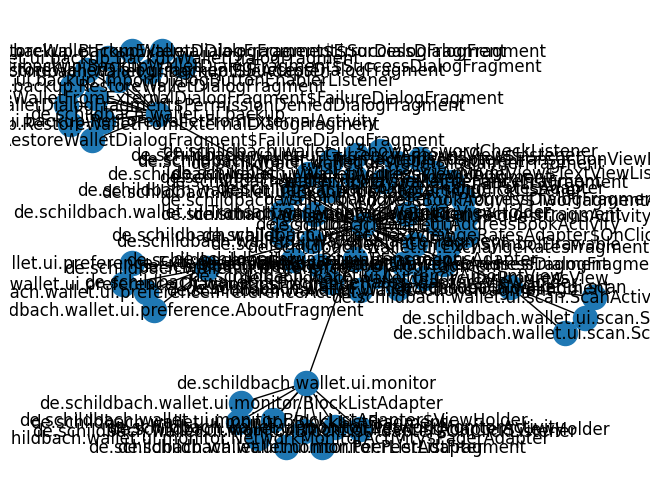

In [90]:
pos = nx.spring_layout(subgraph, scale=0.1)  # Scale down the positions
nx.draw(subgraph, pos, with_labels=True)
plt.show()

In [94]:
dict_features_louvain_coms = dict()

for i in range(len(features_louvain_coms)):
   dict_features_louvain_coms['feature_'+str(i+1)] = [features_louvain_coms[i][j] for j in range(len(features_louvain_coms[i]))]
   
len(dict_features_louvain_coms), dict_features_louvain_coms

(6,
 {'feature_1': ['de.schildbach.wallet.ui.HelpDialogFragment',
   'de.schildbach.wallet.ui.DialogBuilder',
   'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment',
   'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment',
   'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
   'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment',
   'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment',
   'de.schildbach.wallet.ui.send.MaintenanceDialogFragment',
   'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment',
   'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$SuccessDialogFragment'],
  'feature_2': ['de.schildbach.wallet.ui.SendingAddressesFragment',
 

In [155]:
dict_features_louvain_coms_w = dict()

for i in range(len(features_louvain_coms_w)):
   dict_features_louvain_coms_w['feature_'+str(i+1)] = [features_louvain_coms_w[i][j] for j in range(len(features_louvain_coms_w[i]))]
   
len(dict_features_louvain_coms_w), dict_features_louvain_coms_w

(6,
 {'feature_1': ['de.schildbach.wallet.ui.HelpDialogFragment',
   'de.schildbach.wallet.ui.DialogBuilder',
   'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment',
   'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment',
   'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
   'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment',
   'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment',
   'de.schildbach.wallet.ui.send.MaintenanceDialogFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment',
   'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment',
   'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment',
   'de.s

In [73]:
dict_features_leiden_coms_w = dict()

for i in range(len(features_leiden_coms_w)):
   dict_features_leiden_coms_w['feature_'+str(i+1)] = [features_leiden_coms_w[i][j] for j in range(len(features_leiden_coms_w[i]))]
   
len(dict_features_leiden_coms_w), dict_features_leiden_coms_w

(6,
 {'feature_1': ['de.schildbach.wallet.ui.HelpDialogFragment',
   'de.schildbach.wallet.ui.DialogBuilder',
   'de.schildbach.wallet.ui.EditAddressBookEntryFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$SuccessDialogFragment',
   'de.schildbach.wallet.ui.send.RaiseFeeDialogFragment',
   'de.schildbach.wallet.ui.ReportIssueDialogBuilder',
   'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment$FailureDialogFragment',
   'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$ErrorDialogFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment$PermissionDeniedDialogFragment',
   'de.schildbach.wallet.ui.send.MaintenanceDialogFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletDialogFragment',
   'de.schildbach.wallet.ui.MaybeMaintenanceFragment',
   'de.schildbach.wallet.ui.backup.RestoreWalletFromExternalDialogFragment',
   'de.schildbach.wallet.ui.backup.BackupWalletDialogFragment$SuccessDialogFragment',
   'de.s

In [74]:
for i in range(len(features_leiden_coms_w)):
    for j in range(len(features_leiden_coms_w[i])):
        dict_features_leiden_coms_w['feature_'+str(i+1)][j] += ': {}'.format(nodes_sum[features_leiden_coms_w[i][j]]['properties']['description']['Responsibility'])
   
len(dict_features_leiden_coms_w), dict_features_leiden_coms_w

(6,
 {'feature_1': ['de.schildbach.wallet.ui.HelpDialogFragment: Transmit user requests for action or display information that can be updated. The class is responsible for creating and displaying help dialog fragments with specific messages to the user. It manages the presentation of help information in a dialog format, responding to user interactions and displaying relevant content.',
   'de.schildbach.wallet.ui.DialogBuilder: The DialogBuilder class is responsible for managing the user interface elements related to dialogs. It provides methods to set icons, titles, messages, and dismiss buttons for dialogs. By encapsulating the logic for creating and customizing dialogs, it facilitates the transmission of user requests for action or display information that can be updated.',
   'de.schildbach.wallet.ui.EditAddressBookEntryFragment: Controls the application flow, orchestrates domain operations, connects UI events with domain logic, and synchronizes domain changes with the UI. It provi

In [93]:
sum_features_louvain_coms = dict()

for i in range(len(features_louvain_coms)):       
    sum_features_louvain_coms['feature_'+str(i+1)] = [node_data['properties']['description']['Responsibility'] for j in range(len(features_louvain_coms_w[i])) for node_id, node_data in nodes_sum.items() if node_id in features_louvain_coms[i]]

len(sum_features_louvain_coms), sum_features_louvain_coms

(6,
 {'feature_1': ['Handles the process of raising the fee for a Bitcoin transaction by creating a new transaction with a higher fee, broadcasting it to the network, checking if the fee can likely be raised, finding a suitable spendable output in a transaction, and managing the actions and decisions related to fee raising in the wallet.',
   'Transmit user requests for action or display information that can be updated. The class is responsible for creating and displaying help dialog fragments with specific messages to the user. It manages the presentation of help information in a dialog format, responding to user interactions and displaying relevant content.',
   'The DialogBuilder class is responsible for managing the user interface elements related to dialogs. It provides methods to set icons, titles, messages, and dismiss buttons for dialogs. By encapsulating the logic for creating and customizing dialogs, it facilitates the transmission of user requests for action or display infor

In [ ]:
sum_features_louvain_coms_w = dict()

for i in range(len(features_louvain_coms_w)):
    sum_features_louvain_coms_w['feature_'+str(i+1)] = [node_data['properties']['description']['Responsibility'] for node_id, node_data in nodes_sum.items() if node_id in features_louvain_coms_w[i]]

len(sum_features_louvain_coms_w), sum_features_louvain_coms_w

In [75]:
cliet_args = dict()

if 'apikey' in config['openai']:
  cliet_args['api_key'] = config['openai']['apikey']
if 'apibase' in config['openai']:
  cliet_args['base_url'] = config['openai']['apibase']
if 'model' in config['openai']:
  model = config['openai']['model']
else:
  model = "gpt-3.5-turbo"

(list(cliet_args.keys()), model)

(['api_key', 'base_url'], 'gpt-3.5-turbo-0125')

In [76]:
client = OpenAI(**cliet_args)
client.base_url

URL('https://api.openai.com/v1/')

In [77]:
# test the LLM server---create a completion
completion = client.chat.completions.create(
  model=model,
  messages=[{"role":"user","content":"What is your name?"}],
  temperature=0
)
# print the completion
print(completion.choices[0].message.content)

I am a language model AI created by OpenAI, so I do not have a personal name. You can call me Assistant or AI. How can I assist you today?


In [78]:
# If True: do not call the API, just print the prompts
only_print_prompt = False

In [95]:
feat_prompt1_template = '''
**Project Context**: {project_desc}

Consider the following list of Java classes and its responsibility that the combination of classes in the list represents a feature in the project:
**List of Classes**: `{class_list}`

**Task**: 
1. **Summarize the Feature**: Briefly describe the main responsibility of this feature (1-2 sentences).
'''

prompt2_template = '''
In conclusion, declare the feature name that you think represents this feature with below restrictions:
1. Declare in 2-3 words, with no "feature" or "Feature" words.
2. Do not declare the same feature name with other features listed in below features dictionary
```dict
{feature_dict}
``` 

Just answer with the name of the feature in camelCase format, and nothing else.
'''

In [114]:
# feat_prompt1_template = '''
# **Project Context**: {project_desc}
# 
# Consider the following list of Java classes that represents a feature in the project:
# **List of Classes**: `{class_list}`
# 
# Consider the following list of classes responsibility that corresponds with each of the class in the list of Java classes given above:
# **List of Classes Responsibility**: `{class_job_list}`
# 
# **Task**: 
# 1. **Summarize the Feature**: Briefly describe the main responsibility of this feature in high level software abstraction (1-2 sentences).
# '''
# 
# prompt2 = "In conclusion, declare the feature name (2-3 words, with no 'feature' or 'Feature' word, do not declare the same feature name with other features) that you think represents this feature. Just answer with the name of the feature in camelCase format, and nothing else."

In [96]:
timestr = time.strftime("%Y%m%d-%H%M%S")
timestr

'20240704-212815'

In [97]:
# Initialize the goals dictionary
project_feat = dict()

# Open the log file
with open(f'{project_name}-features-{leiden_coms_w.method_name}-{timestr}.log', 'a') as file:

    # Loop over the features in dict_features_leiden_coms_w
    for feature in tqdm(dict_features_leiden_coms_w.keys(), desc='Processing features'):
        # Get the classes and descriptions for the current feature
        classes = dict_features_leiden_coms_w[feature]
        # descriptions = sum_features_louvain_coms[feature]

        # Write the feature and classes to the log file
        file.write(f"# {feature}\n")
        for i, cls in enumerate(classes):
            file.write(f"\t* {cls}\n")
            
        # # Create a prompt for the OpenAI API
        # prompt = "\\n".join(descriptions)
        # 
        # # Call the OpenAI API to get a summary of the descriptions
        # response = client.chat.completions.create(
        #     model="text-davinci-002",
        #     messages=[
        #         {"role": "system", "content": "You are a helpful assistant."},
        #         {"role": "user", "content": prompt}
        #     ],
        #     max_tokens=100,
        #     temperature=0.5,
        #     top_p=1
        # )
        # 
        # # Get the summary from the response
        # summary = response['choices'][0]['message']['content']
        # 
        # # Write the summary to the log file
        # file.write(f"\\t\\t {summary}\\n")
        # 
        # # Add the summary to the goals dictionary
        if feature not in project_feat:
            project_feat[feature] = dict()
        # goals[feature]["summary"] = summary
        

        prompt1 = feat_prompt1_template.format(
            project_desc=project_desc,
            class_list=classes
            # class_job_list=descriptions
        )
        prompt2 = prompt2_template.format(
            feature_dict=project_feat
        )
        
        if only_print_prompt:
            file.write('\t\t\t' + prompt1)
            file.write("\n\n")
        else:
            response = None
            try:
                response = client.chat.completions.create(
                    model=model,
                    messages=[{
                        "role": "user",
                        "content": prompt1
                    }],
                    temperature=0)
                ast_message = response.choices[0].message

                file.write('\t\t\t' + "[USER]\n\n")
                file.write('\t\t\t' + prompt1)
                file.write("\n\n")
                file.write('\t\t\t' + "[LLM]\n\n")
                file.write('\t\t\t' + ast_message.content)
                file.write("\n\n")
                
                response = client.chat.completions.create(
                    model=model,
                    messages=[{
                        "role": "user",
                        "content": prompt1
                    }, 
                    ast_message,
                    {
                        "role": "user",
                        "content": prompt2
                    }],
                    temperature=0)
                answer = response.choices[0].message.content

                file.write('\t\t\t' + "[USER]\n\n")
                file.write('\t\t\t' + prompt2)
                file.write("\n\n")
                file.write('\t\t\t' + "[LLM]\n\n")
                file.write('\t\t\t' + answer)
                file.write("\n\n")

                project_feat[feature]['feature_name'] = answer
                project_feat[feature]['description'] = ast_message.content
            except:
                answer = None
                file.write('\t\t\t' + (str(response) if response else "no response"))
                file.write("\n\n")
                project_feat[feature]['features_name'] = "undefined"
                project_feat[feature]['description'] = "undefined"
        
        project_feat[feature]['p_layer_classes'] = classes
        # project_feat[feature]['p_layer_classes_desc'] = descriptions
        file.write("\n\n")

    file.write("ALL RESULTS:\n\n")
    file.write(prettify_json(project_feat))

Processing features: 100%|██████████| 6/6 [00:12<00:00,  2.08s/it]


In [98]:
project_feat

{'feature_1': {'feature_name': 'manageDialogUIElements',
  'description': 'The feature is responsible for managing the user interface elements related to dialogs, including displaying help information, editing address book entries, raising transaction fees, reporting issues, and handling wallet restoration processes with success and failure messages.',
  'p_layer_classes': ['de.schildbach.wallet.ui.HelpDialogFragment: Transmit user requests for action or display information that can be updated. The class is responsible for creating and displaying help dialog fragments with specific messages to the user. It manages the presentation of help information in a dialog format, responding to user interactions and displaying relevant content.',
   'de.schildbach.wallet.ui.DialogBuilder: The DialogBuilder class is responsible for managing the user interface elements related to dialogs. It provides methods to set icons, titles, messages, and dismiss buttons for dialogs. By encapsulating the logic

In [99]:
len(project_feat)

6

In [100]:
other_feat_list = sorted_list_ccw[1:]

len(other_feat_list), other_feat_list

(4,
 [['de.schildbach.wallet.ui.WalletBalanceFragment',
   'de.schildbach.wallet.ui.ExchangeRatesAdapter',
   'de.schildbach.wallet.ui.CurrencyTextView'],
  ['de.schildbach.wallet.ui.monitor.BlockListAdapter$OnClickListener',
   'de.schildbach.wallet.ui.monitor.BlockListAdapter'],
  ['de.schildbach.wallet.ui.TransactionsAdapter',
   'de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener'],
  ['de.schildbach.wallet.ui.ExchangeRatesFragment$ExchangeRatesLiveData',
   'de.schildbach.wallet.ui.ExchangeRatesFragment']])

In [101]:
dict_other_features = dict()

for i in range(len(other_feat_list)):
   dict_other_features['feature_'+str(i+1+len(project_feat))] = [other_feat_list[i][j] for j in range(len(other_feat_list[i]))]
   
len(dict_other_features), dict_other_features

(4,
 {'feature_7': ['de.schildbach.wallet.ui.WalletBalanceFragment',
   'de.schildbach.wallet.ui.ExchangeRatesAdapter',
   'de.schildbach.wallet.ui.CurrencyTextView'],
  'feature_8': ['de.schildbach.wallet.ui.monitor.BlockListAdapter$OnClickListener',
   'de.schildbach.wallet.ui.monitor.BlockListAdapter'],
  'feature_9': ['de.schildbach.wallet.ui.TransactionsAdapter',
   'de.schildbach.wallet.ui.TransactionsAdapter$OnClickListener'],
  'feature_10': ['de.schildbach.wallet.ui.ExchangeRatesFragment$ExchangeRatesLiveData',
   'de.schildbach.wallet.ui.ExchangeRatesFragment']})

In [102]:
for i in range(len(other_feat_list)):
    for j in range(len(other_feat_list[i])):
        dict_other_features['feature_'+str(i+1+len(project_feat))][j] += ': {}'.format(nodes_sum[other_feat_list[i][j]]['properties']['description']['Responsibility'])
   
len(dict_other_features), dict_other_features

(4,
 {'feature_7': ['de.schildbach.wallet.ui.WalletBalanceFragment: User Interfacer',
   'de.schildbach.wallet.ui.ExchangeRatesAdapter: Transmitting user requests for action or display information that can be updated. The class is responsible for managing the UI elements related to displaying exchange rates and handling user interactions with those elements.',
   'de.schildbach.wallet.ui.CurrencyTextView: CurrencyTextView class is responsible for handling requests related to displaying and formatting monetary values in the user interface. It provides methods to set the amount, format, color, scale, and other properties of the displayed text. It also updates the view with the formatted monetary amount based on the provided parameters. As a Service Provider in the Presentation Layer, CurrencyTextView manages the specific services related to currency display and interacts with the user interface to ensure proper presentation of monetary values.'],
  'feature_8': ['de.schildbach.wallet.ui.

In [103]:
timestr = time.strftime("%Y%m%d-%H%M%S")
timestr

'20240704-212935'

In [104]:
# Open the log file
with open(f'{project_name}-other-features-{timestr}.log', 'a') as file:

    # Loop over the features in dict_other_features
    for feature in tqdm(dict_other_features.keys(), desc='Processing features'):
        # Get the classes and descriptions for the current feature
        classes = dict_other_features[feature]
        # descriptions = sum_features_louvain_coms[feature]

        # Write the feature and classes to the log file
        file.write(f"# {feature}\n")
        for i, cls in enumerate(classes):
            file.write(f"\t* {cls}\n")
            
        # # Create a prompt for the OpenAI API
        # prompt = "\\n".join(descriptions)
        # 
        # # Call the OpenAI API to get a summary of the descriptions
        # response = client.chat.completions.create(
        #     model="text-davinci-002",
        #     messages=[
        #         {"role": "system", "content": "You are a helpful assistant."},
        #         {"role": "user", "content": prompt}
        #     ],
        #     max_tokens=100,
        #     temperature=0.5,
        #     top_p=1
        # )
        # 
        # # Get the summary from the response
        # summary = response['choices'][0]['message']['content']
        # 
        # # Write the summary to the log file
        # file.write(f"\\t\\t {summary}\\n")
        # 
        # # Add the summary to the goals dictionary
        if feature not in project_feat:
            project_feat[feature] = dict()
        # goals[feature]["summary"] = summary
        

        prompt1 = feat_prompt1_template.format(
            project_desc=project_desc,
            class_list=classes
            # class_job_list=descriptions
        )
        prompt2 = prompt2_template.format(
            feature_dict=project_feat
        )
        
        if only_print_prompt:
            file.write('\t\t\t' + prompt1)
            file.write("\n\n")
        else:
            response = None
            try:
                response = client.chat.completions.create(
                    model=model,
                    messages=[{
                        "role": "user",
                        "content": prompt1
                    }],
                    temperature=0)
                ast_message = response.choices[0].message

                file.write('\t\t\t' + "[USER]\n\n")
                file.write('\t\t\t' + prompt1)
                file.write("\n\n")
                file.write('\t\t\t' + "[LLM]\n\n")
                file.write('\t\t\t' + ast_message.content)
                file.write("\n\n")
                
                response = client.chat.completions.create(
                    model=model,
                    messages=[{
                        "role": "user",
                        "content": prompt1
                    }, 
                    ast_message,
                    {
                        "role": "user",
                        "content": prompt2
                    }],
                    temperature=0)
                answer = response.choices[0].message.content

                file.write('\t\t\t' + "[USER]\n\n")
                file.write('\t\t\t' + prompt2)
                file.write("\n\n")
                file.write('\t\t\t' + "[LLM]\n\n")
                file.write('\t\t\t' + answer)
                file.write("\n\n")

                project_feat[feature]['feature_name'] = answer
                project_feat[feature]['description'] = ast_message.content
            except:
                answer = None
                file.write('\t\t\t' + (str(response) if response else "no response"))
                file.write("\n\n")
                project_feat[feature]['features_name'] = "undefined"
                project_feat[feature]['description'] = "undefined"
        
        project_feat[feature]['p_layer_classes'] = classes
        # project_feat[feature]['p_layer_classes_desc'] = descriptions
        file.write("\n\n")

    file.write("ALL RESULTS:\n\n")
    file.write(prettify_json(project_feat))

Processing features: 100%|██████████| 4/4 [00:09<00:00,  2.33s/it]


In [105]:
project_feat

{'feature_1': {'feature_name': 'manageDialogUIElements',
  'description': 'The feature is responsible for managing the user interface elements related to dialogs, including displaying help information, editing address book entries, raising transaction fees, reporting issues, and handling wallet restoration processes with success and failure messages.',
  'p_layer_classes': ['de.schildbach.wallet.ui.HelpDialogFragment: Transmit user requests for action or display information that can be updated. The class is responsible for creating and displaying help dialog fragments with specific messages to the user. It manages the presentation of help information in a dialog format, responding to user interactions and displaying relevant content.',
   'de.schildbach.wallet.ui.DialogBuilder: The DialogBuilder class is responsible for managing the user interface elements related to dialogs. It provides methods to set icons, titles, messages, and dismiss buttons for dialogs. By encapsulating the logic

In [106]:
write_to_json_file(project_feat, f'../../test/3-features-identification-output/{project_name}-features-list-{timestr}.json')

In [122]:
class_sum_list = []

# print(list(sorted_components_sum[0]))

for node_id in list(sorted_components_sum[0]):
    # print(nodes_sum[node_id]['properties']['description'])
    # print(nodes_sum[node_id]['properties']['description']['Responsibility'])
    # print(nodes_sum[node_id]['properties']['description']['Purpose'])
    # print(node_id)
    if 'Responsibility' in nodes_sum[node_id]['properties']['description']:
        class_sum_list += [nodes_sum[node_id]['properties']['description']['Responsibility']]
    elif 'Purpose' in nodes_sum[node_id]['properties']['description']:
        class_sum_list += [nodes_sum[node_id]['properties']['description']['Purpose']]
    
class_sum_list

['The class is responsible for managing the user interface related to restoring a wallet. It handles user input for selecting backup files, entering passwords, and initiating the restoration process. It updates the view dynamically based on available backup files and related information, and shows dialogs for success or failure messages during the restoration process. The class facilitates user interaction with the wallet restoration functionality.',
 'Manages the user interface, defines UI elements and behavior, displays information, responds to user input, and updates views. Contains classes responsible for controlling the initialization, display, and interaction of various preference fragments within the user interface.',
 "Transmitting user requests for action or display information that can be updated. The class is responsible for inflating a layout resource, setting the empty text message, and managing the visual representation of the fragment's view.",
 'Transmitting user reques

UFuncTypeError: ufunc 'minimum' did not contain a loop with signature matching types (dtype('<U64'), dtype('<U64')) -> None

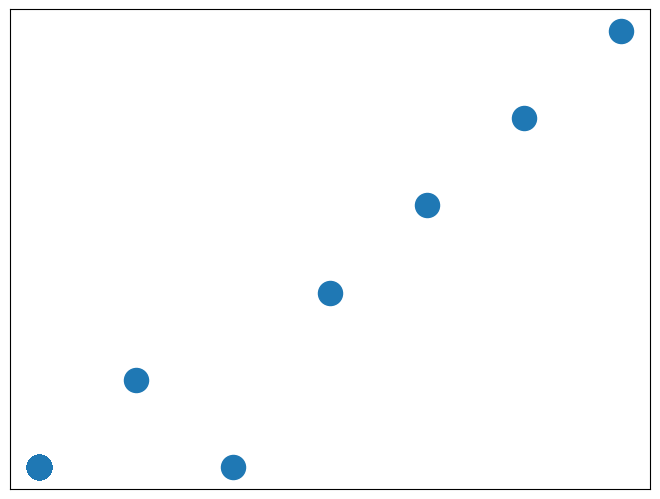

In [97]:
# Choose a root node
root = list(sorted_components_sum[0])[0]  # Here we just choose the first node as the root

# Compute the BFS layout manually
pos = {node: (level, i) for i, (level, node) in enumerate(nx.bfs_predecessors(subgraph, root))}

# Assign a default position to nodes that are not reached by the BFS
for node in subgraph.nodes():
    if node not in pos:
        pos[node] = (0, 0)  # You can replace (0, 0) with any default position

# Draw the subgraph using the BFS layout
nx.draw(subgraph, pos, with_labels=True)

# Show the plot
plt.show()

In [94]:
print(nx.__version__)

3.2.1


In [95]:
!pip install --upgrade networkx==3.3

ERROR: Ignored the following versions that require a different python version: 3.3 Requires-Python >=3.10; 3.3rc0 Requires-Python >=3.10
ERROR: Could not find a version that satisfies the requirement networkx==3.3 (from versions: 0.34, 0.35, 0.35.1, 0.36, 0.37, 0.99, 1.0rc1, 1.0, 1.0.1, 1.1, 1.2rc1, 1.2, 1.3rc1, 1.3, 1.4rc1, 1.4, 1.5rc1, 1.5, 1.6rc1, 1.6, 1.7rc1, 1.7, 1.8rc1, 1.8, 1.8.1, 1.9rc1, 1.9, 1.9.1, 1.10rc2, 1.10, 1.11rc1, 1.11rc2, 1.11, 2.0, 2.1, 2.2rc1, 2.2, 2.3rc3, 2.3rc4, 2.3, 2.4rc1, 2.4rc2, 2.4, 2.5rc1, 2.5, 2.5.1, 2.6rc1, 2.6rc2, 2.6, 2.6.1, 2.6.2, 2.6.3, 2.7rc1, 2.7, 2.7.1, 2.8rc1, 2.8, 2.8.1rc1, 2.8.1, 2.8.2, 2.8.3, 2.8.4, 2.8.5, 2.8.6, 2.8.7, 2.8.8, 3.0b1, 3.0rc1, 3.0, 3.1rc0, 3.1, 3.2rc0, 3.2, 3.2.1)
ERROR: No matching distribution found for networkx==3.3

[notice] A new release of pip is available: 23.2.1 -> 24.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [91]:
# Add invisible nodes and edges
for node in subgraph.nodes():
    subgraph.add_node(f"label_{node}")
    subgraph.add_edge(node, f"label_{node}", color="white")

# Draw the graph with invisible nodes and edges
nx.draw(subgraph, with_labels=True, edge_color=nx.get_edge_attributes(subgraph, 'color').values())
plt.show()

NetworkXError: Frozen graph can't be modified

## Archive

In [19]:
# edges_paths = sorted(find_paths(edges['contains'], edges['hasScript']))
# edges_paths

[('de.schildbach.wallet',
  'de.schildbach.wallet.Configuration',
  'de.schildbach.wallet.Configuration.armBackupReminder()'),
 ('de.schildbach.wallet',
  'de.schildbach.wallet.Configuration',
  'de.schildbach.wallet.Configuration.changeLogVersionCodeCrossed(int,int)'),
 ('de.schildbach.wallet',
  'de.schildbach.wallet.Configuration',
  'de.schildbach.wallet.Configuration.de.schildbach.wallet.Configuration(android.content.SharedPreferences,android.content.res.Resources)'),
 ('de.schildbach.wallet',
  'de.schildbach.wallet.Configuration',
  'de.schildbach.wallet.Configuration.disarmBackupReminder()'),
 ('de.schildbach.wallet',
  'de.schildbach.wallet.Configuration',
  'de.schildbach.wallet.Configuration.getBestChainHeightEver()'),
 ('de.schildbach.wallet',
  'de.schildbach.wallet.Configuration',
  'de.schildbach.wallet.Configuration.getBlockExplorer()'),
 ('de.schildbach.wallet',
  'de.schildbach.wallet.Configuration',
  'de.schildbach.wallet.Configuration.getBtcBase()'),
 ('de.schildba

In [20]:
# methods = sorted([(pkg_id,cls_id,met_id) for pkg_id,cls_id,met_id in find_paths(edges['contains'], edges['hasScript']) if (nodes[met_id]['properties']['visibility']=='public' and nodes[met_id]['properties']['layer']=='Presentation Layer')])
# len(methods), methods

(423,
 [('de.schildbach.wallet',
   'de.schildbach.wallet.WalletBalanceWidgetProvider',
   'de.schildbach.wallet.WalletBalanceWidgetProvider.onAppWidgetOptionsChanged(android.content.Context,android.appwidget.AppWidgetManager,int,android.os.Bundle)'),
  ('de.schildbach.wallet',
   'de.schildbach.wallet.WalletBalanceWidgetProvider',
   'de.schildbach.wallet.WalletBalanceWidgetProvider.onUpdate(android.content.Context,android.appwidget.AppWidgetManager,int[])'),
  ('de.schildbach.wallet',
   'de.schildbach.wallet.WalletBalanceWidgetProvider',
   'de.schildbach.wallet.WalletBalanceWidgetProvider.updateWidgets(android.content.Context,org.bitcoinj.core.Coin,de.schildbach.wallet.data.ExchangeRate)'),
  ('de.schildbach.wallet.integration.android',
   'de.schildbach.wallet.integration.android.BitcoinIntegration',
   'de.schildbach.wallet.integration.android.BitcoinIntegration.requestForResult(android.app.Activity,int,java.lang.String)'),
  ('de.schildbach.wallet.integration.sample',
   'de.sch

In [21]:
# classes = sorted({(pkg,clz) for pkg,clz,_ in methods})
# len(classes), classes

(108,
 [('de.schildbach.wallet', 'de.schildbach.wallet.WalletBalanceWidgetProvider'),
  ('de.schildbach.wallet.integration.android',
   'de.schildbach.wallet.integration.android.BitcoinIntegration'),
  ('de.schildbach.wallet.integration.sample',
   'de.schildbach.wallet.integration.sample.SampleActivity'),
  ('de.schildbach.wallet.offline',
   'de.schildbach.wallet.offline.DirectPaymentTask$ResultCallback'),
  ('de.schildbach.wallet.service',
   'de.schildbach.wallet.service.BlockchainService$NewTransactionLiveData$WalletListener'),
  ('de.schildbach.wallet.ui',
   'de.schildbach.wallet.ui.AbstractWalletActivity'),
  ('de.schildbach.wallet.ui', 'de.schildbach.wallet.ui.AddressAndLabel'),
  ('de.schildbach.wallet.ui', 'de.schildbach.wallet.ui.AddressBookActivity'),
  ('de.schildbach.wallet.ui',
   'de.schildbach.wallet.ui.AddressBookActivity$TwoFragmentAdapter'),
  ('de.schildbach.wallet.ui', 'de.schildbach.wallet.ui.AlertDialogsFragment'),
  ('de.schildbach.wallet.ui', 'de.schildbach.w

In [15]:
# packages = sorted({pkg for pkg,_ in classes})
# len(packages),packages

(12,
 ['de.schildbach.wallet',
  'de.schildbach.wallet.integration.android',
  'de.schildbach.wallet.integration.sample',
  'de.schildbach.wallet.offline',
  'de.schildbach.wallet.service',
  'de.schildbach.wallet.ui',
  'de.schildbach.wallet.ui.backup',
  'de.schildbach.wallet.ui.monitor',
  'de.schildbach.wallet.ui.preference',
  'de.schildbach.wallet.ui.scan',
  'de.schildbach.wallet.ui.send',
  'de.schildbach.wallet.util'])

In [16]:
# results = {pkg_id:{
# 	'qualifiedName': nodes[pkg_id]['properties']['qualifiedName'],
# 	# 'layer': nodes[pkg_id]['properties']['layer'],
# 	'classes': {cls_id: {
# 		'qualifiedName': nodes[cls_id]['properties']['qualifiedName'],
# 		# 'layer': nodes[cls_id]['properties']['layer'],
# 		'methods': {met_id: {
# 			'qualifiedName': nodes[met_id]['properties']['qualifiedName'],
# 			'layer': nodes[met_id]['properties']['layer']
# 		} for _,c,met_id in methods if c == cls_id}
# 	} for p,cls_id in classes if p == pkg_id}
# } for pkg_id in packages}
# 
# results

{'de.schildbach.wallet': {'qualifiedName': 'de.schildbach.wallet',
  'classes': {'de.schildbach.wallet.WalletBalanceWidgetProvider': {'qualifiedName': 'de.schildbach.wallet.WalletBalanceWidgetProvider',
    'methods': {'de.schildbach.wallet.WalletBalanceWidgetProvider.onAppWidgetOptionsChanged(android.content.Context,android.appwidget.AppWidgetManager,int,android.os.Bundle)': {'qualifiedName': 'de.schildbach.wallet.WalletBalanceWidgetProvider.onAppWidgetOptionsChanged(android.content.Context,android.appwidget.AppWidgetManager,int,android.os.Bundle)',
      'layer': 'Presentation Layer'},
     'de.schildbach.wallet.WalletBalanceWidgetProvider.onUpdate(android.content.Context,android.appwidget.AppWidgetManager,int[])': {'qualifiedName': 'de.schildbach.wallet.WalletBalanceWidgetProvider.onUpdate(android.content.Context,android.appwidget.AppWidgetManager,int[])',
      'layer': 'Presentation Layer'},
     'de.schildbach.wallet.WalletBalanceWidgetProvider.updateWidgets(android.content.Conte

In [ ]:
# p_layer_edges = extract_edges(edges, )

In [ ]:
# edges_paths = sorted(invert(edges['contains'], edges['hasScript']))
# edges_paths